# Imports and Configurations

In [1]:
# Experiment
EXP_NUM = 3
DATASET = 'IDSM'
CONTENT = 'dry/wet'
GRANULARITY = 5
TARGET_COL = 'category'
CLASS_MAP = {
    'no-rain': 'No Rain', 
    'light': 'Light', 'moderate': 'Moderate', 
    'heavy': 'Heavy', 'violent': 'Violent'
}

import pandas as pd
import sys
from pathlib import Path
import joblib
import warnings
warnings.filterwarnings('ignore')

current_path = Path.cwd()
PROJECT_ROOT = None

for p in [current_path, current_path.parent, current_path.parent.parent]:
    if (p / "rainfall_acoustic_classification").exists():
        PROJECT_ROOT = p
        break

if PROJECT_ROOT:
    if str(PROJECT_ROOT) not in sys.path:
        sys.path.insert(0, str(PROJECT_ROOT))
    print(f"Project root added to sys.path")
else:
    print("ERROR: Unable to find the project root.")

from rainfall_acoustic_classification.visualization import VisualizationEngine
from rainfall_acoustic_classification.utils import get_standard_logger

# Feature Engineering
from rainfall_acoustic_classification.feature_engineering import (
    # Core modules
    ExperimentCreator, ExperimentConfig, 
    
    # Single Metric (PSD_mean) 
    SingleSelectorConfig, build_single_selector,

    # Metrics Selection
    VectorSelectorConfig, VectorSelector,
    
    # Vizualization
    plot_correlation_heatmap, plot_individual_boxplots, plot_feature_importance, plot_fisher_scores
)

# Modeling
from rainfall_acoustic_classification.modeling import (
    # Classification
    ClassifierFactory, ClassifierConfig,

    # Hyperparameter Optimization
    ModelOptimizer,TuningConfig,

    # Validation
    ModelEvaluator, ValidationConfig,

    #Vizualization
    plot_confusion_matrix_grid, plot_multiclass_pr_curve, plot_experiment_performance_heatmap
)

# Directories
DATA_DIR = PROJECT_ROOT / "data" / "processed" / DATASET
REPORTS_DIR = PROJECT_ROOT / "reports" / "vector_selector" / "experiment_3" / DATASET
MODELS_DIR = PROJECT_ROOT / "models" / "vector_selector" / "experiment_3" / DATASET

REPORTS_DIR.mkdir(parents=True, exist_ok=True)
MODELS_DIR.mkdir(parents=True, exist_ok=True)

Project root added to sys.path


# Data Loading and Mapping

In [2]:
df_train_metrics = pd.read_csv(DATA_DIR /  f"{DATASET}_train_metrics.csv")
df_val_metrics = pd.read_csv(DATA_DIR / f"{DATASET}_val_metrics.csv")
df_test_metrics = pd.read_csv(DATA_DIR / f"{DATASET}_test_metrics.csv")

print(f"Raw Shapes -> Train: {df_train_metrics.shape}, Val: {df_val_metrics.shape}, Test: {df_test_metrics.shape}")

Raw Shapes -> Train: (28331, 124), Val: (2618, 123), Test: (2618, 123)


In [3]:
metadata_cols = [
    'file_name', 'timestamp', 'period', 'mm_5min', 'mm_hr', 
    'category', 'recorder', 'location', 'file_path', 'extension', 
    'year', 'month', 'day', 'hour', 'minute', 'second', 'wet', 'split', 
    'should_augment', 'segment_idx', 'offset_sec', 'aug_params'
    ]

exp_config = ExperimentConfig(content=CONTENT,
                              granularity=GRANULARITY, 
                              label_col=TARGET_COL,
                              metadata_cols = metadata_cols,
                              custom_mapping=CLASS_MAP)

X_train_metrics, y_train_metrics, _ = ExperimentCreator.extract_X_y_meta(df_train_metrics, config=exp_config)
X_train, y_train = ExperimentCreator.apply_experiment_rules(X_train_metrics, y_train_metrics, config=exp_config)


X_val_metrics, y_val_metrics, _ = ExperimentCreator.extract_X_y_meta(df_val_metrics, config=exp_config)
X_val, y_val = ExperimentCreator.apply_experiment_rules(X_val_metrics, y_val_metrics, config=exp_config)


X_test_metrics, y_test_metrics, _ = ExperimentCreator.extract_X_y_meta(df_test_metrics, config=exp_config)
X_test, y_test = ExperimentCreator.apply_experiment_rules(X_test_metrics, y_test_metrics, config=exp_config)

print(f"Classes post mapping -> Train: {y_train.unique()}, Val: {y_val.unique()}, Test: {y_test.unique()}")

21:35:58 - [ExperimentCreator] - INFO - Applying Smart Rules -> Content: 'dry/wet' | Granularity: 5
21:35:58 - [ExperimentCreator] - INFO - Applying Smart Rules -> Content: 'dry/wet' | Granularity: 5
21:35:58 - [ExperimentCreator] - INFO - Applying Smart Rules -> Content: 'dry/wet' | Granularity: 5
Classes post mapping -> Train: <StringArray>
['No Rain', 'Moderate', 'Heavy', 'Light', 'Violent']
Length: 5, dtype: str, Val: <StringArray>
['Moderate', 'Light', 'No Rain', 'Heavy', 'Violent']
Length: 5, dtype: str, Test: <StringArray>
['Light', 'Violent', 'Moderate', 'No Rain', 'Heavy']
Length: 5, dtype: str


# Feature Engineering (Metrics Selection and PSD)

In [4]:
metrics_selector_config = VectorSelectorConfig(corr_threshold=0.85, 
                                               rf_n_estimators=100, 
                                               fisher_percentile=10)
metrics_selector = VectorSelector(metrics_selector_config)

X_train_selected_metrics = metrics_selector.fit_transform(X_train, y_train)

survivors = metrics_selector.get_feature_names_out()
print(f"Original Features: {X_train.shape[1]} -> Selected: {X_train_selected_metrics.shape[1]}")
print(f"Selected ones: {survivors}")

X_val_selected_metrics = metrics_selector.transform(X_val)
X_test_selected_metrics = metrics_selector.transform(X_test)

df_feature_tracking = metrics_selector.get_metrics_report()

Original Features: 102 -> Selected: 10
Selected ones: ['NDSI' 'spec_skew' 'spec_kurtosis' 'mfcc_1' 'mfcc_mean' 'mfcc_var'
 'wav_approx_std' 'wav_detail_lvl5_std' 'wav_detail_lvl4_std'
 'wav_detail_lvl3_std']


## Graphics

In [5]:
display(df_feature_tracking.head(50))

,Feature_Name,Fisher_Score,Gini_Importance,Survived_Pipeline
78,mfcc_mean,56441.626629,NaN,1
85,wav_detail_lvl5_std,22888.609092,NaN,1
82,wav_approx_std,21891.742752,NaN,1
30,spec_skew,16253.713664,NaN,1
38,mfcc_1,16199.659306,NaN,1
7,NDSI,15741.248606,NaN,1
31,spec_kurtosis,15737.271855,NaN,1
80,mfcc_var,14417.163146,NaN,1
89,wav_detail_lvl3_std,14286.367110,NaN,1
87,wav_detail_lvl4_std,13727.294432,NaN,1


In [6]:
display(df_feature_tracking.tail(52))

,Feature_Name,Fisher_Score,Gini_Importance,Survived_Pipeline
20,zcr_std,947.323335,NaN,0
52,mfcc_8,867.593284,NaN,0
56,mfcc_10,797.938527,NaN,0
0,temp_entropy,781.923792,NaN,0
29,spec_var,701.181792,NaN,0
21,zcr_var,594.070229,NaN,0
8,ratioBA,593.794006,NaN,0
33,spec_flatness,584.859602,NaN,0
36,spec_bandwidth_90%,526.220797,NaN,0
10,bio_energy,501.651292,NaN,0


In [7]:
viz_engine = VisualizationEngine()
palette = viz_engine.get_rain_color_palette()
rain_palette = dict(list(palette.items())[:5])
exp_palette = {k: v for k, v in rain_palette.items() if k in y_train.unique()}
ordered_classes = list(exp_palette.keys())

selected_metrics = df_feature_tracking[df_feature_tracking['Survived_Pipeline'] == 1]['Feature_Name'].tolist()
X_train_fischer_metrics = X_train[selected_metrics]

11:29:21 - [FeaturePlots] - INFO - Generating Correlation Heatmap...


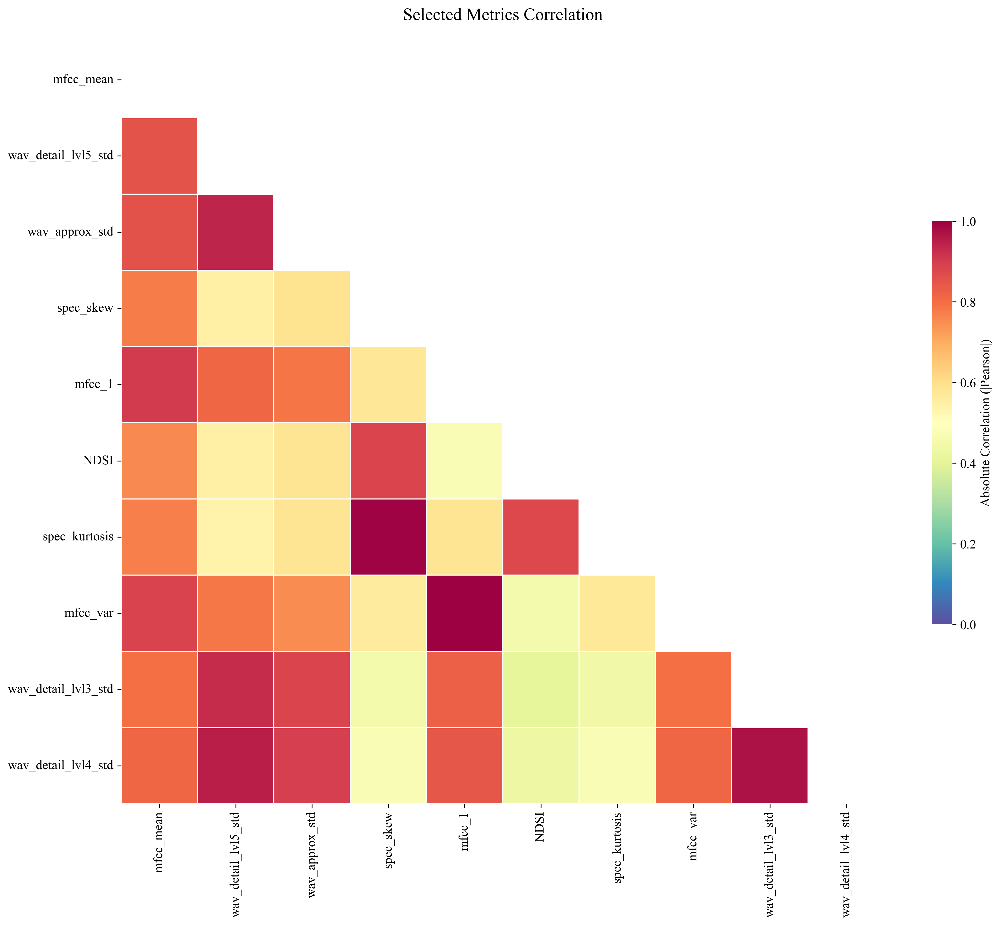

In [8]:
plot_correlation_heatmap(
    df=X_train_fischer_metrics,
    threshold=0.85,
    title=f"Selected Metrics Correlation"
)

11:29:21 - [FeaturePlots] - INFO - Generating Individual Boxplots for 10 features...


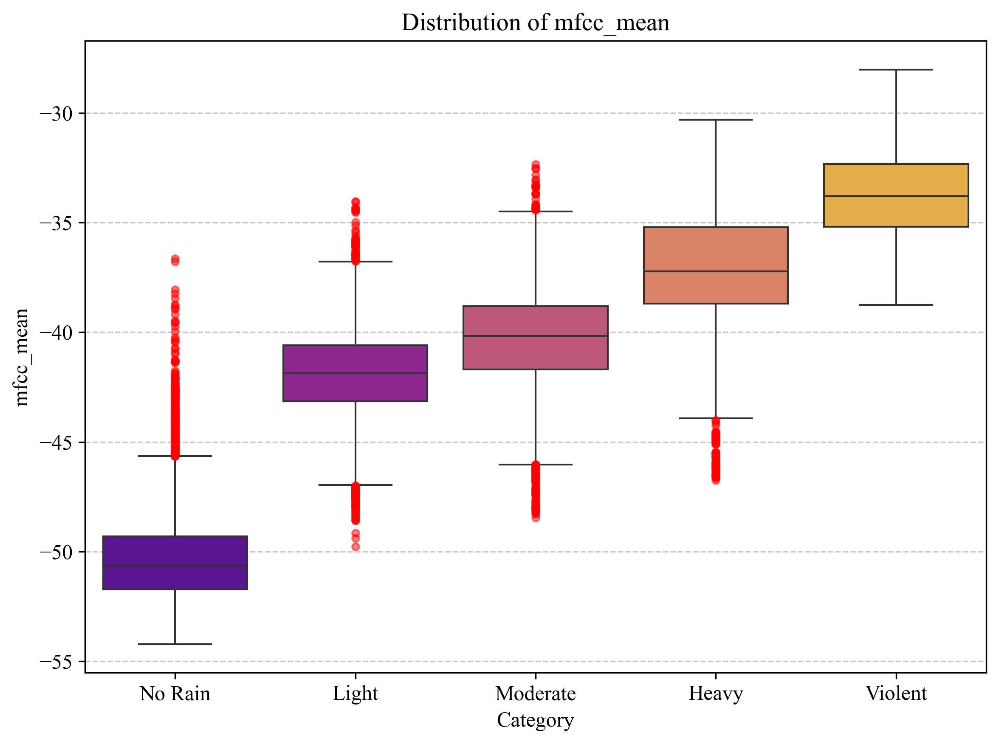

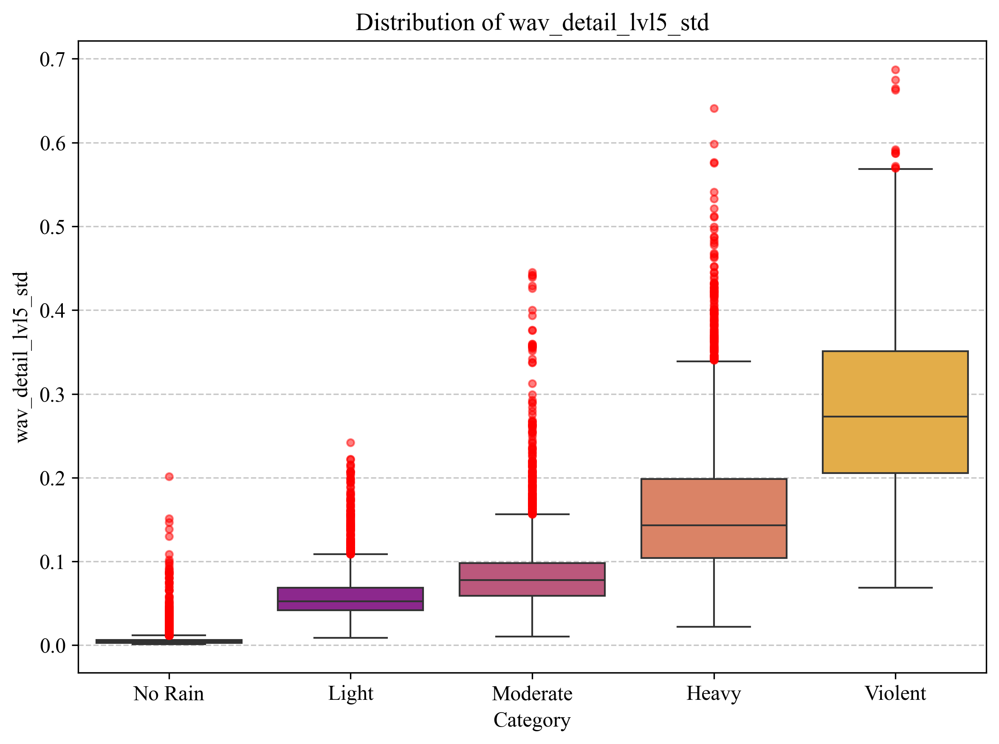

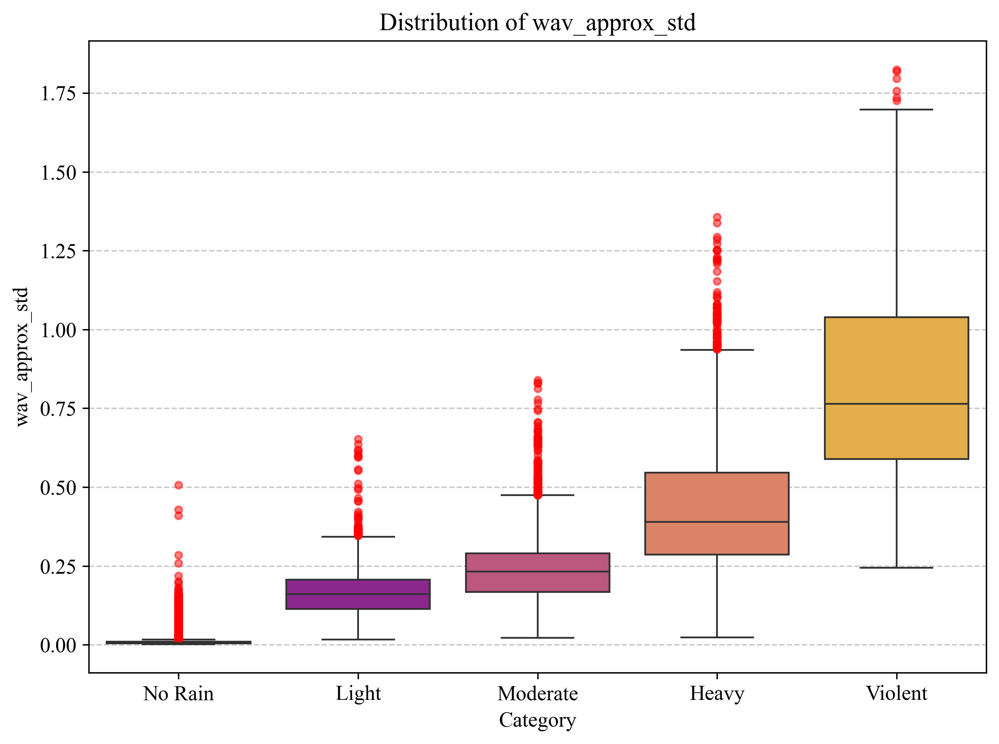

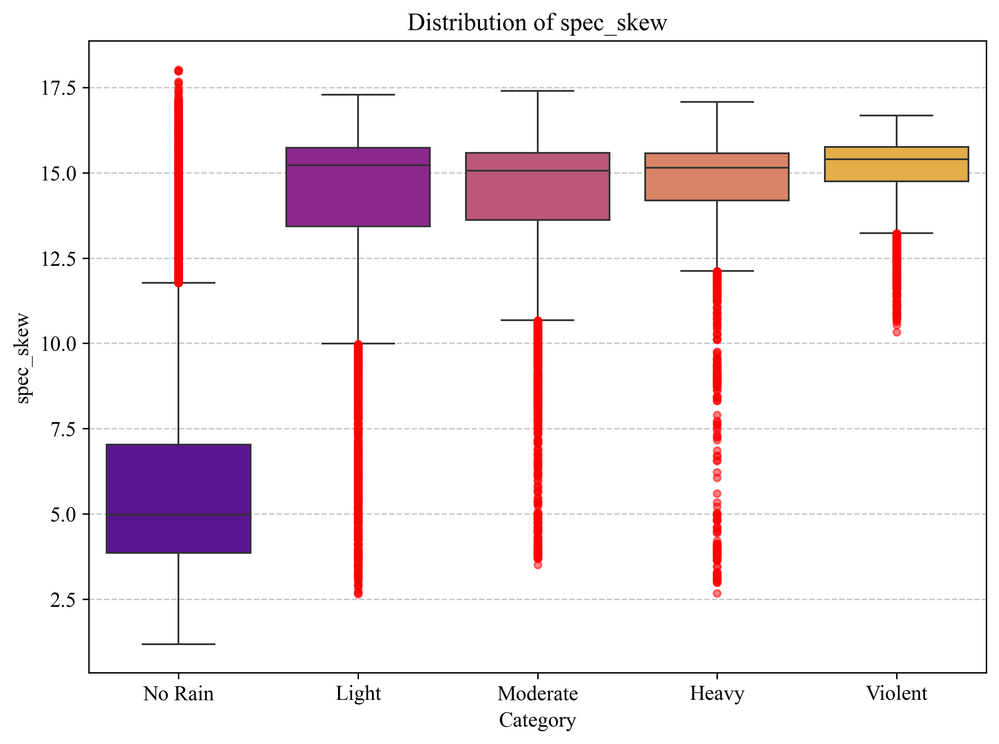

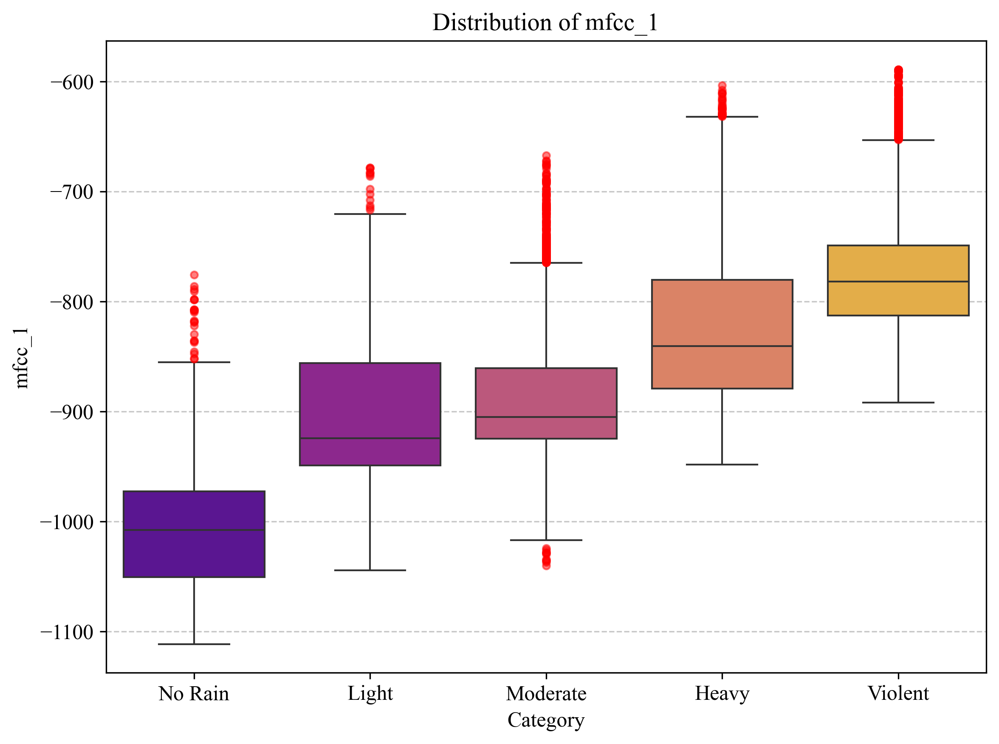

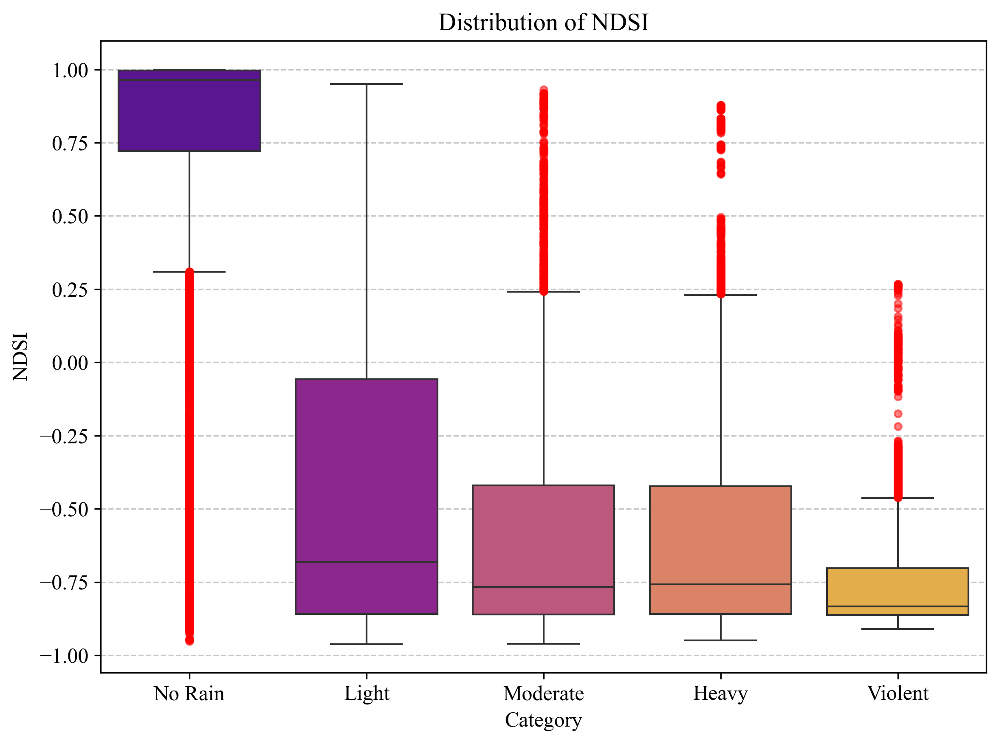

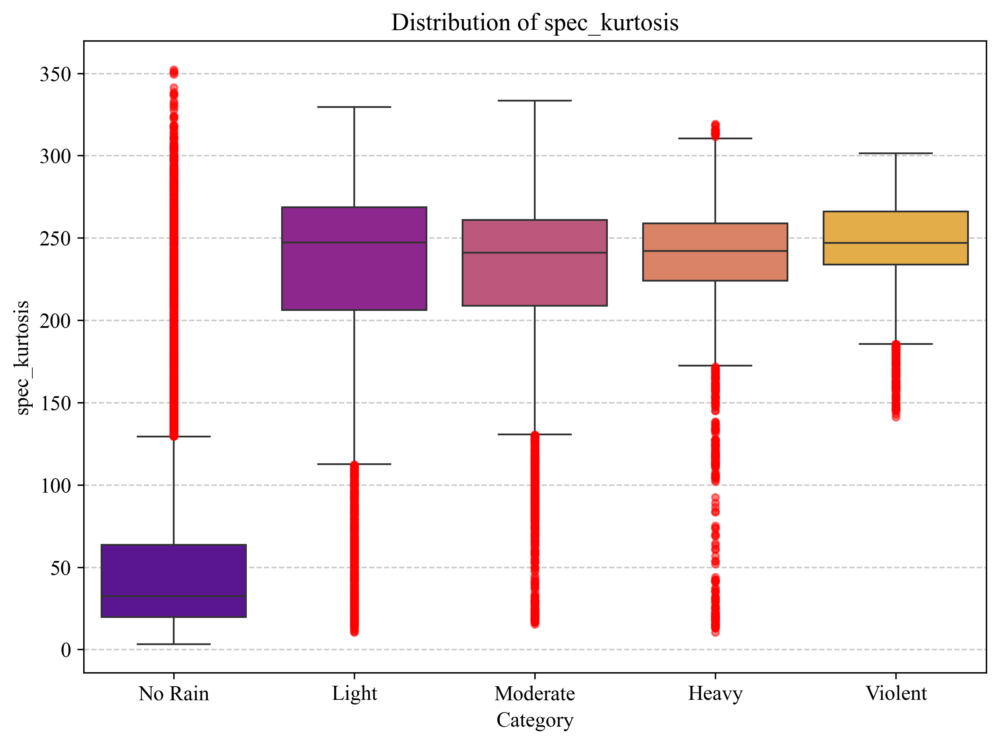

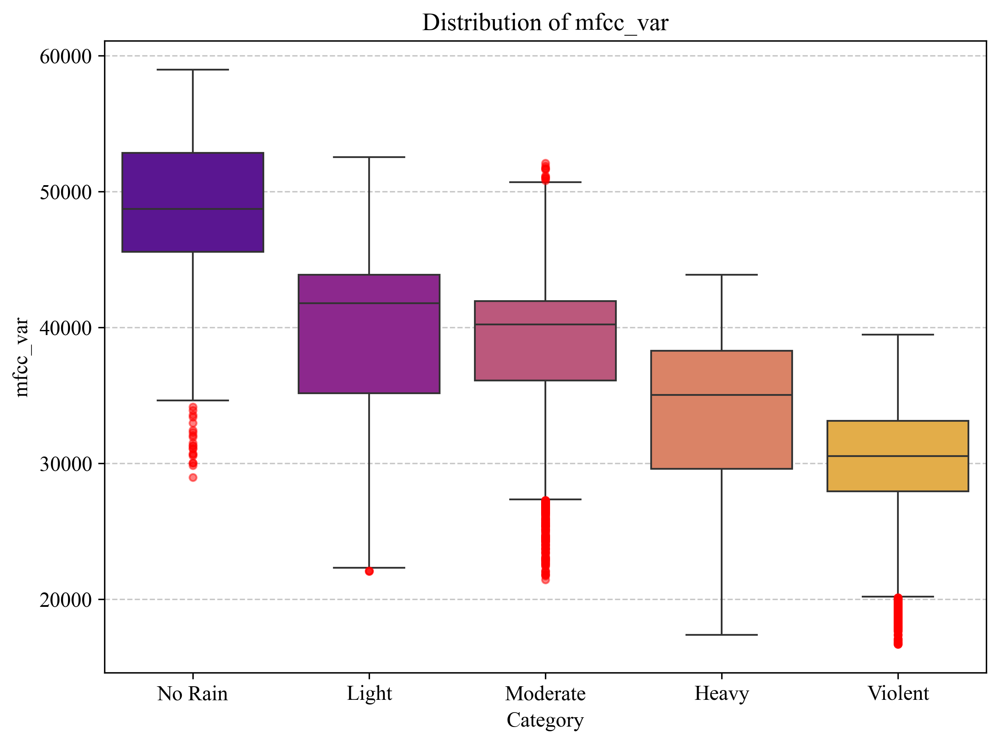

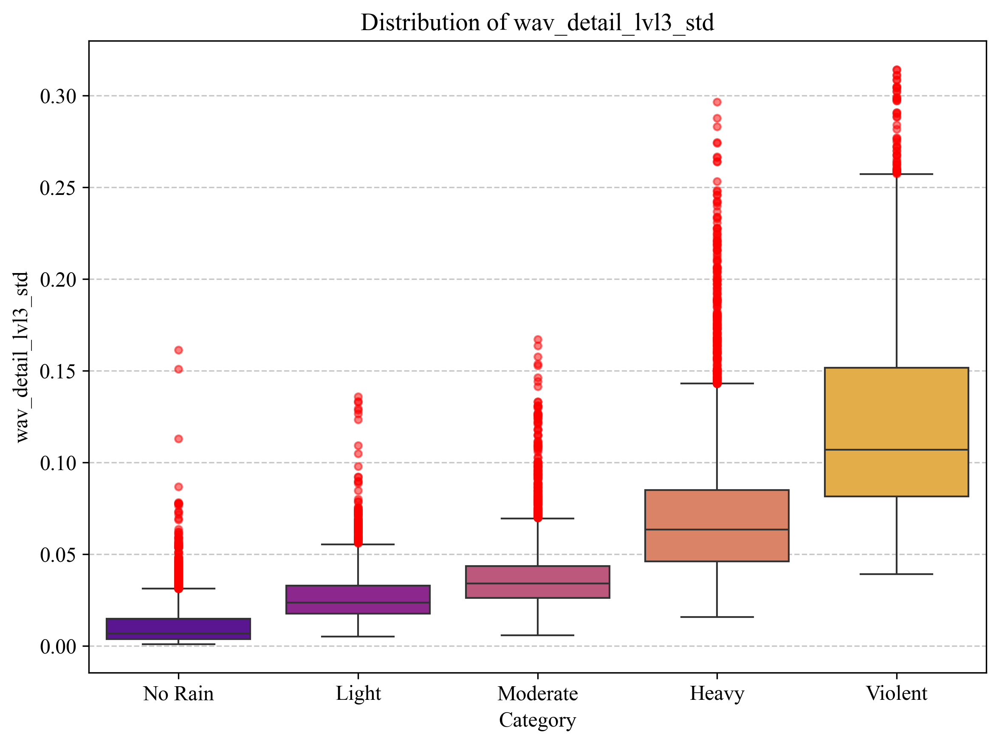

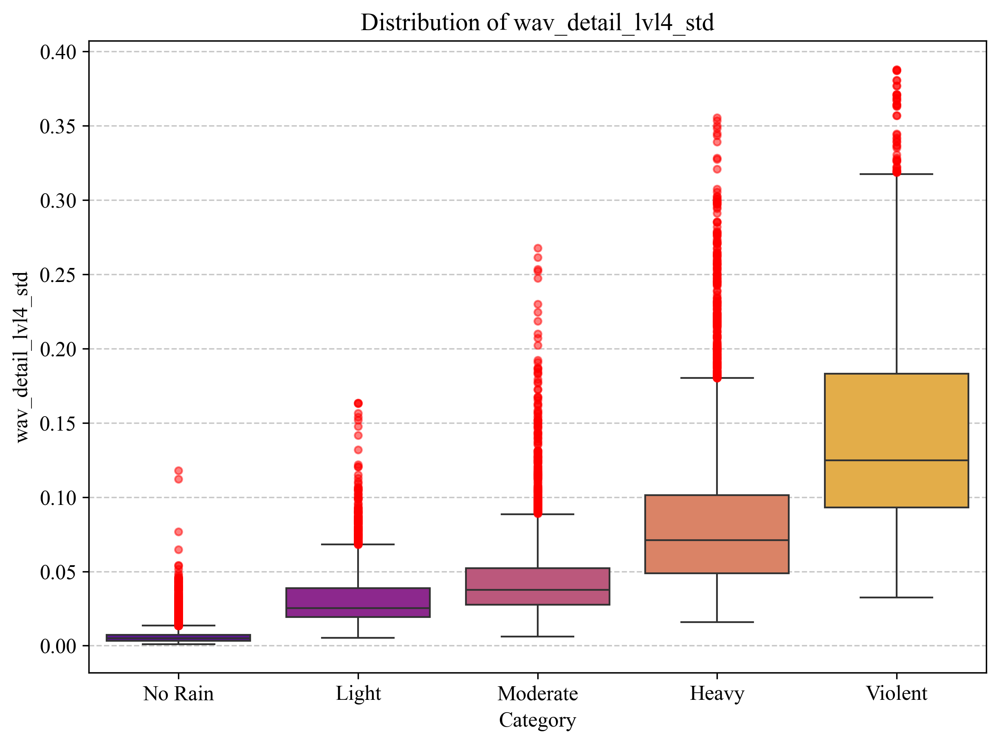

In [9]:
plot_individual_boxplots(
    X=X_train_fischer_metrics, 
    y=y_train, 
    color_map=rain_palette,
    class_order=ordered_classes
)

11:29:23 - [FeaturePlots] - INFO - Generating Fisher Score Plot (Top 10)...


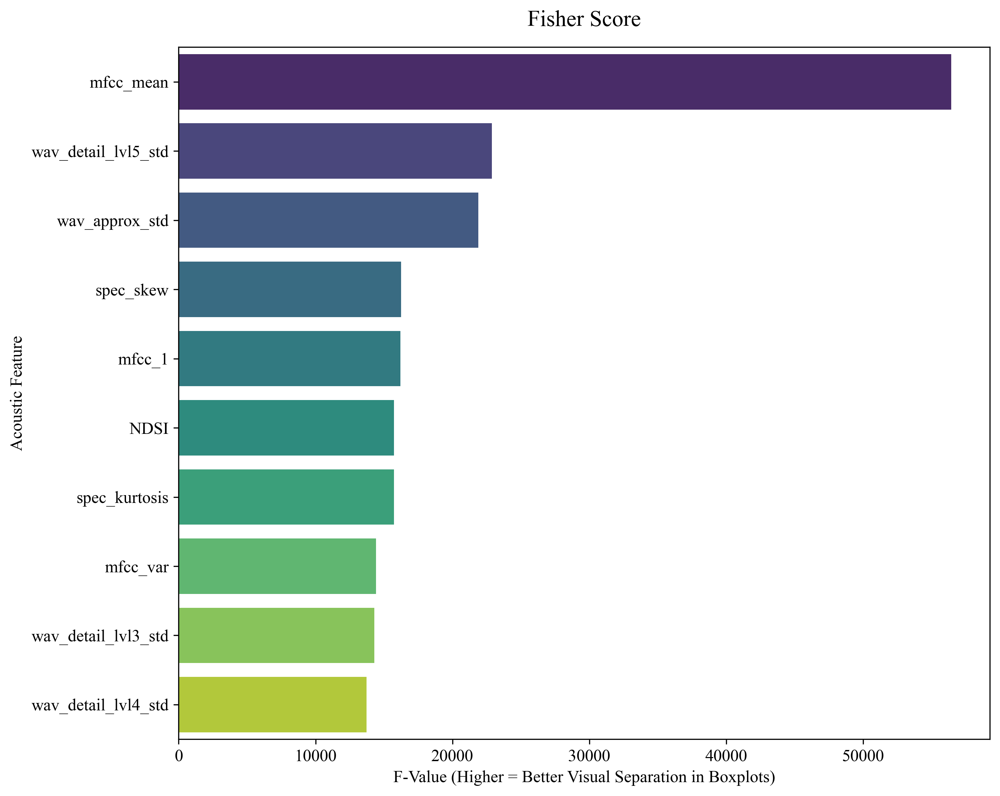

In [10]:
plot_fisher_scores(
    df_tracking=df_feature_tracking, 
    top_n=10,
    title="Fisher Score"
)

In [23]:
df_feature_tracking.info()

<class 'pandas.DataFrame'>
Index: 102 entries, 78 to 101
Data columns (total 4 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Feature_Name       102 non-null    str    
 1   Fisher_Score       95 non-null     float64
 2   Gini_Importance    0 non-null      float64
 3   Survived_Pipeline  102 non-null    int64  
dtypes: float64(2), int64(1), str(1)
memory usage: 5.1 KB


## PSD

In [13]:
psd_selector_config = SingleSelectorConfig(target_feature='psd_mean', 
                                           fisher_percentile=60)
psd_selector = build_single_selector(psd_selector_config)


X_train_psd = psd_selector.fit_transform(X_train, y_train)
print(f"Original Features: {X_train.shape[1]} -> Selected: {X_train_psd.shape[1]}")
print(f"Selected ones: {X_train_psd.columns}")

X_val_psd = psd_selector.transform(X_val)
X_test_psd = psd_selector.transform(X_test)

14:07:26 - [FeatureSelector] - INFO - Isolated 'psd_mean' | Fisher Score (F-Value): 5967.16
Original Features: 102 -> Selected: 1
Selected ones: Index(['psd_mean'], dtype='str')


11:29:23 - [FeaturePlots] - INFO - Generating Individual Boxplots for 1 features...


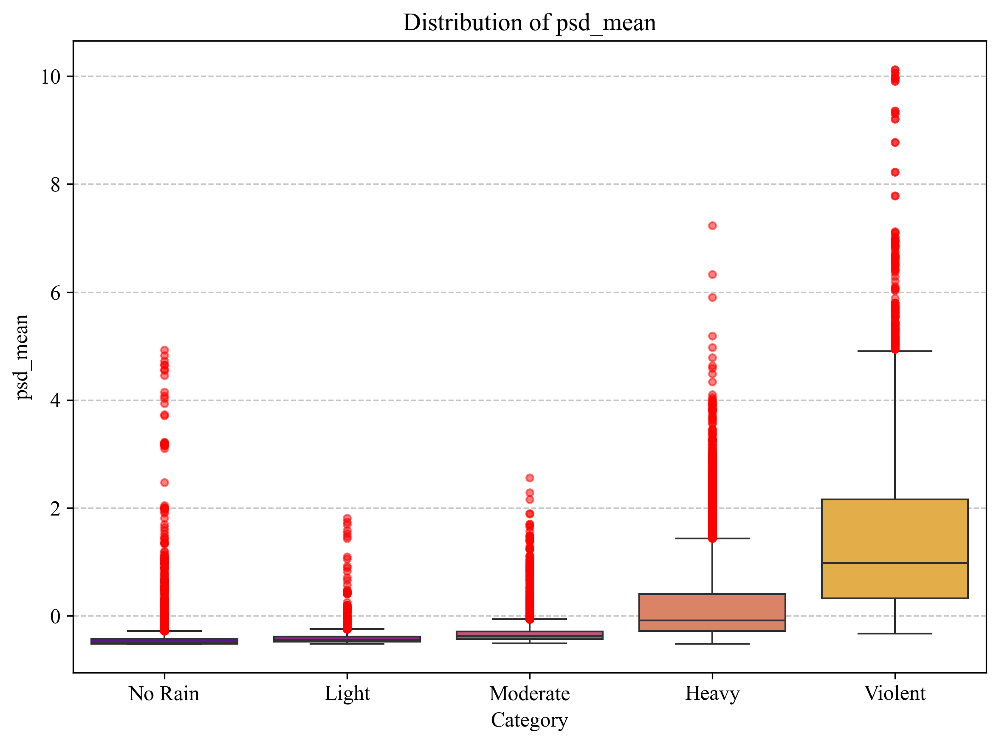

In [12]:
plot_individual_boxplots(
    X=X_train_psd, 
    y=y_train, 
    color_map=rain_palette, 
    class_order=ordered_classes
)

# Modeling

## PSD

In [29]:
sgd_config = ClassifierConfig(model_type='sgd', random_state=42, n_jobs=-1)
sgd_base = ClassifierFactory.build(sgd_config)

sgd_grid = {
    'alpha': [0.0001, 0.001],
    'penalty': ['l2', 'elasticnet'],
    'class_weight': ['balanced']
}

tuning_config = TuningConfig(param_grid=sgd_grid, scoring_metric='f1_macro', n_jobs=-1)

sgd_champion = ModelOptimizer.optimize(
    estimator=sgd_base, 
    X_train=X_train_psd, 
    y_train=y_train, 
    X_val=X_val_psd, 
    y_val=y_val, 
    config=tuning_config
)

val_config = ValidationConfig(average_method='macro', return_report_dict=True)

metrics_sgd = ModelEvaluator.evaluate(
    model=sgd_champion, 
    X_test=X_test_psd, 
    y_test=y_test, 
    config=val_config
)

for chave, valor in metrics_sgd.items():
    if isinstance(valor, (int, float, str)):
        print(f" -> {chave}: {valor}")

12:02:28 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
12:02:28 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
12:02:28 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 4 candidates, totalling 4 fits
12:02:28 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.3543
12:02:28 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'alpha': 0.001, 'class_weight': 'balanced', 'penalty': 'l2'}
12:02:28 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:02:28 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:02:28 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.2592 | PR-AUC: 0.4752879978312685
 -> f1_macro: 0.2592366009472587
 -> pr_auc_macro: 0.4752879978312685


In [32]:
lr_config = ClassifierConfig(model_type='lr', random_state=42)
lr_base = ClassifierFactory.build(lr_config)

lr_grid = {
    'C': [0.1, 1.0, 10.0], 
    'class_weight': ['balanced'], 
    'solver': ['lbfgs'], 
    'max_iter': [1000]
}

tuning_config_lr = TuningConfig(param_grid=lr_grid, scoring_metric='f1_macro', n_jobs=-1)

lr_champion = ModelOptimizer.optimize(
    estimator=lr_base, 
    X_train=X_train_psd, 
    y_train=y_train_enc,
    X_val=X_val_psd, 
    y_val=y_val_enc, 
    config=tuning_config_lr
)

val_config = ValidationConfig(average_method='macro', return_report_dict=True)
metrics_lr = ModelEvaluator.evaluate(
    model=lr_champion, 
    X_test=X_test_psd, 
    y_test=y_test_enc, 
    config=val_config
)

for chave, valor in metrics_lr.items():
    if isinstance(valor, (int, float, str)):
        print(f" -> {chave}: {valor}")


12:06:23 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
12:06:23 - [ClassifierFactory] - INFO - Building registered model architecture: LR
12:06:23 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 3 candidates, totalling 3 fits
12:06:23 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.4983
12:06:23 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'C': 10.0, 'class_weight': 'balanced', 'max_iter': 1000, 'solver': 'lbfgs'}
12:06:23 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:06:23 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:06:23 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.4290 | PR-AUC: 0.45431426027195354
 -> f1_macro: 0.42902977941074516
 -> pr_auc_macro: 0.45431426027195354


In [33]:
rf_config = ClassifierConfig(model_type='rf', random_state=42)
rf_base = ClassifierFactory.build(rf_config)

rf_grid = {
    'n_estimators': [100, 200], 
    'max_depth': [None, 5, 10], 
    'min_samples_leaf': [1, 2]
}
tuning_config_rf = TuningConfig(param_grid=rf_grid, scoring_metric='f1_macro', n_jobs=-1)

rf_champion = ModelOptimizer.optimize(
    estimator=rf_base, 
    X_train=X_train_psd, 
    y_train=y_train_enc, 
    X_val=X_val_psd, 
    y_val=y_val_enc, 
    config=tuning_config_rf
)

metrics_rf = ModelEvaluator.evaluate(
    model=rf_champion, 
    X_test=X_test_psd, 
    y_test=y_test_enc, 
    config=val_config
)

for chave, valor in metrics_rf.items():
    if isinstance(valor, (int, float, str)):
        print(f" -> {chave}: {valor}")

12:07:15 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
12:07:15 - [ClassifierFactory] - INFO - Building registered model architecture: RF
12:07:15 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 12 candidates, totalling 12 fits
12:07:18 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.4851
12:07:18 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 1, 'n_estimators': 100}
12:07:18 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:07:18 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:07:18 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.3949 | PR-AUC: 0.44081036145883046
 -> f1_macro: 0.3948922117563145
 -> pr_auc_macro: 0.44081036145883046


In [34]:
xgb_config = ClassifierConfig(model_type='xgb', random_state=42)
xgb_base = ClassifierFactory.build(xgb_config)

xgb_grid = {
    'n_estimators': [100, 200], 
    'max_depth': [3, 5], 
    'learning_rate': [0.01, 0.1]
}
tuning_config_xgb = TuningConfig(param_grid=xgb_grid, scoring_metric='f1_macro', n_jobs=-1)

xgb_champion = ModelOptimizer.optimize(
    estimator=xgb_base, 
    X_train=X_train_psd, 
    y_train=y_train_enc, # OBRIGATÓRIO: Variável Numérica (0 a 4)
    X_val=X_val_psd, 
    y_val=y_val_enc,     # OBRIGATÓRIO: Variável Numérica (0 a 4)
    config=tuning_config_xgb
)

metrics_xgb = ModelEvaluator.evaluate(
    model=xgb_champion, 
    X_test=X_test_psd, 
    y_test=y_test_enc,   # OBRIGATÓRIO: Variável Numérica (0 a 4)
    config=val_config
)

for chave, valor in metrics_xgb.items():
    if isinstance(valor, (int, float, str)):
        print(f" -> {chave}: {valor}")

12:08:02 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
12:08:02 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
12:08:02 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 8 candidates, totalling 8 fits
12:08:04 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.4755
12:08:04 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
12:08:04 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:08:04 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:08:04 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.3905 | PR-AUC: 0.45651339672406566
 -> f1_macro: 0.3904638266129471
 -> pr_auc_macro: 0.45651339672406566


## Selected Metrics

In [5]:
import matplotlib.pyplot as plt
import seaborn as sns

MAX_FEATURES = 10
top_10_features = df_feature_tracking[df_feature_tracking['Survived_Pipeline'] == 1]['Feature_Name'].head(MAX_FEATURES).tolist()

12:11:04 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
--- Treinando com 1 Feature(s) [Adicionada agora: mfcc_mean] ---
12:11:04 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
12:11:04 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 4 candidates, totalling 4 fits
12:11:05 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.5249
12:11:05 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'alpha': 0.001, 'class_weight': 'balanced', 'penalty': 'elasticnet'}
12:11:05 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:11:05 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:11:05 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.4644 | PR-AUC: 0.5853863282485673
--- Treinando com 2 Feature(s) [Adicionada agora: wav_detail_lvl

,Dimensao,Ultima_Feature_Inclusa,F1_Macro,Accuracy
0,1,mfcc_mean,0.464402,0.0
1,2,wav_detail_lvl5_std,0.624221,0.0
2,3,wav_approx_std,0.620445,0.0
3,4,spec_skew,0.583998,0.0
4,5,mfcc_1,0.582355,0.0
5,6,NDSI,0.579277,0.0
6,7,spec_kurtosis,0.558092,0.0
7,8,mfcc_var,0.564530,0.0
8,9,wav_detail_lvl3_std,0.591338,0.0
9,10,wav_detail_lvl4_std,0.623258,0.0


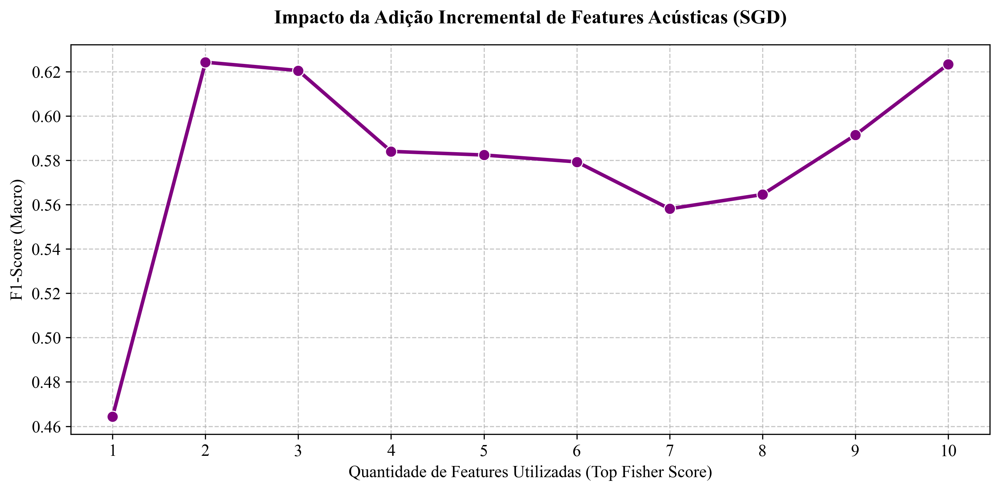

In [36]:
sgd_config = ClassifierConfig(model_type='sgd', random_state=42)
sgd_grid = {
    'alpha': [0.0001, 0.001], 
    'penalty': ['l2', 'elasticnet'], 
    'class_weight': ['balanced']
}
tuning_config_sgd = TuningConfig(param_grid=sgd_grid, scoring_metric='f1_macro', n_jobs=-1)
val_config = ValidationConfig(average_method='macro', return_report_dict=False)

incremental_results_sgd = []

for k in range(1, MAX_FEATURES + 1):
    current_features = top_10_features[:k]
    feature_adicionada = current_features[-1]
    
    print(f"--- Treinando com {k} Feature(s) [Adicionada agora: {feature_adicionada}] ---")
    
    # Fatiamento da matriz usando as listas de nomes
    X_tr_slice = X_train_selected_metrics[current_features]
    X_va_slice = X_val_selected_metrics[current_features]
    X_te_slice = X_test_selected_metrics[current_features]
    
    try:
        # A. Constrói o modelo
        sgd_base = ClassifierFactory.build(sgd_config)
        
        # B. Otimiza (Tuning)
        sgd_champion = ModelOptimizer.optimize(
            estimator=sgd_base, 
            X_train=X_tr_slice, 
            y_train=y_train_enc, # Usando a variável numérica que criamos para evitar erros
            X_val=X_va_slice, 
            y_val=y_val_enc, 
            config=tuning_config_sgd
        )
        
        # C. Avalia no Teste (O veredito final daquele conjunto)
        metrics_sgd = ModelEvaluator.evaluate(
            model=sgd_champion, 
            X_test=X_te_slice, 
            y_test=y_test_enc, 
            config=val_config
        )
        
        # D. Extração Segura das Métricas (Tratando possíveis mudanças no dicionário)
        f1  = metrics_sgd.get('f1_macro', metrics_sgd.get('f1_score', metrics_sgd.get('f1', 0.0)))
        acc = metrics_sgd.get('accuracy', metrics_sgd.get('accuracy_score', 0.0))
        
        incremental_results_sgd.append({
            'Dimensao': k,
            'Ultima_Feature_Inclusa': feature_adicionada,
            'F1_Macro': f1,
            'Accuracy': acc
        })
        
    except Exception as e:
        print(f"❌ Falha no passo com {k} features: {e}")

# 4. Tabela de Resultados
df_sgd_incremental = pd.DataFrame(incremental_results_sgd)
print("\n📊 Tabela de Desempenho Incremental:")
display(df_sgd_incremental)

# 5. O Gráfico Definitivo (Curva de Aprendizado por Dimensão)
plt.figure(figsize=(10, 5))
sns.lineplot(
    data=df_sgd_incremental, 
    x='Dimensao', 
    y='F1_Macro', 
    marker='o', 
    color='purple', 
    linewidth=2.5,
    markersize=8
)

plt.title("Impacto da Adição Incremental de Features Acústicas (SGD)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Utilizadas (Top Fisher Score)", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)
plt.xticks(range(1, MAX_FEATURES + 1))
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

# Salva se a pasta REPORTS_DIR estiver definida
if 'REPORTS_DIR' in locals():
    plt.savefig(REPORTS_DIR / f"{DATASET}_E{EXP_NUM}_SGD_Incremental.pdf", dpi=300, bbox_inches='tight')

plt.show()

🚀 Teste de Escalonamento de Features (Incremental) - Regressão Logística (LR)
12:12:45 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
--- Treinando LR com 1 Feature(s) [+ mfcc_mean] ---
12:12:45 - [ClassifierFactory] - INFO - Building registered model architecture: LR
12:12:45 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 3 candidates, totalling 3 fits
12:12:45 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.6594
12:12:45 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'C': 1.0, 'class_weight': 'balanced', 'max_iter': 1000, 'solver': 'lbfgs'}
12:12:45 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:12:45 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:12:45 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.5827 | PR-AUC: 0.62601228516

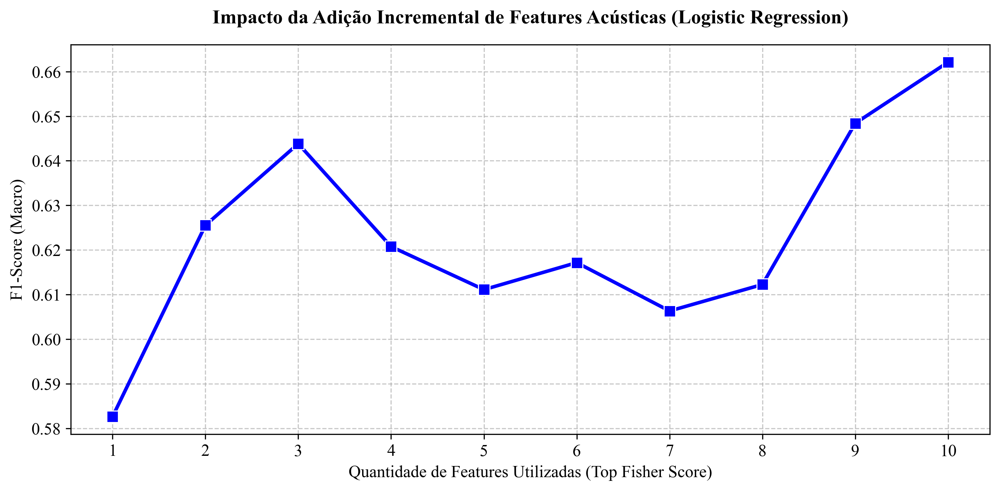

In [37]:
# ==============================================================================
# Teste Unitário de Dimensão: Incremental Feature Scaling no LR
# ==============================================================================
print("="*60)
print("🚀 Teste de Escalonamento de Features (Incremental) - Regressão Logística (LR)")
print("="*60)

# Configurações do LR
lr_config = ClassifierConfig(model_type='lr', random_state=42)
lr_grid = {
    'C': [0.1, 1.0, 10.0], 
    'class_weight': ['balanced'], 
    'solver': ['lbfgs'], 
    'max_iter': [1000]
}
tuning_config_lr = TuningConfig(param_grid=lr_grid, scoring_metric='f1_macro', n_jobs=-1)

incremental_results_lr = []

for k in range(1, MAX_FEATURES + 1):
    current_features = top_10_features[:k]
    feature_adicionada = current_features[-1]
    print(f"--- Treinando LR com {k} Feature(s) [+ {feature_adicionada}] ---")
    
    X_tr_slice = X_train_selected_metrics[current_features]
    X_va_slice = X_val_selected_metrics[current_features]
    X_te_slice = X_test_selected_metrics[current_features]
    
    try:
        lr_base = ClassifierFactory.build(lr_config)
        lr_champion = ModelOptimizer.optimize(
            estimator=lr_base, X_train=X_tr_slice, y_train=y_train_enc, 
            X_val=X_va_slice, y_val=y_val_enc, config=tuning_config_lr
        )
        metrics_lr = ModelEvaluator.evaluate(model=lr_champion, X_test=X_te_slice, y_test=y_test_enc, config=val_config)
        
        f1  = metrics_lr.get('f1_macro', metrics_lr.get('f1_score', metrics_lr.get('f1', 0.0)))
        acc = metrics_lr.get('accuracy', metrics_lr.get('accuracy_score', 0.0))
        
        incremental_results_lr.append({'Dimensao': k, 'Ultima_Feature_Inclusa': feature_adicionada, 'F1_Macro': f1, 'Accuracy': acc})
    except Exception as e:
        print(f"❌ Falha no passo com {k} features: {e}")

# Gráfico
df_lr_incremental = pd.DataFrame(incremental_results_lr)
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_lr_incremental, x='Dimensao', y='F1_Macro', marker='s', color='blue', linewidth=2.5, markersize=8)
plt.title("Impacto da Adição Incremental de Features Acústicas (Logistic Regression)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Utilizadas (Top Fisher Score)", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)
plt.xticks(range(1, MAX_FEATURES + 1))
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

🚀 Teste de Escalonamento de Features (Incremental) - Random Forest (RF)
12:13:06 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
--- Treinando RF com 1 Feature(s) [+ mfcc_mean] ---
12:13:06 - [ClassifierFactory] - INFO - Building registered model architecture: RF
12:13:06 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 12 candidates, totalling 12 fits
12:13:07 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.6147
12:13:07 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_depth': 5, 'min_samples_leaf': 1, 'n_estimators': 100}
12:13:07 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:13:08 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:13:08 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.5731 | PR-AUC: 0.6468937674665493
--- Treinando

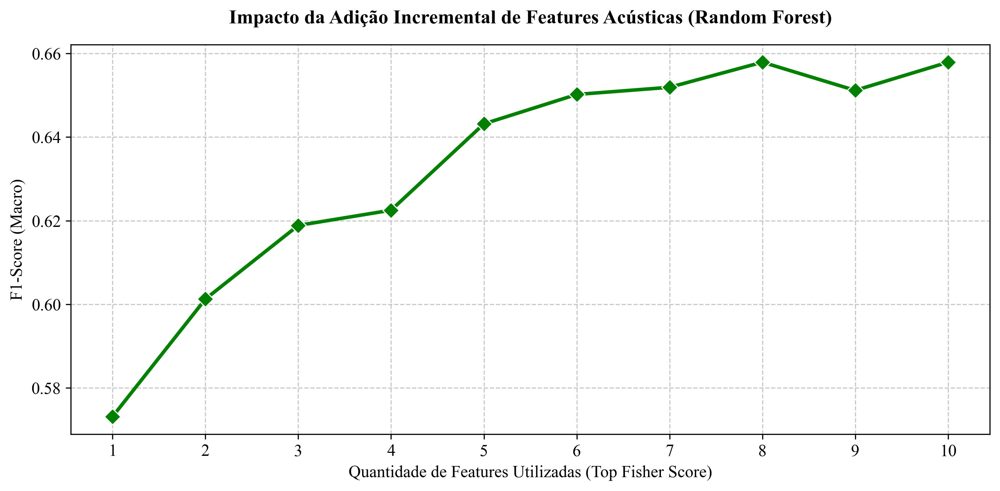

In [38]:
# ==============================================================================
# Teste Unitário de Dimensão: Incremental Feature Scaling no RF
# ==============================================================================
print("="*60)
print("🚀 Teste de Escalonamento de Features (Incremental) - Random Forest (RF)")
print("="*60)

# Configurações do RF
rf_config = ClassifierConfig(model_type='rf', random_state=42)
rf_grid = {
    'n_estimators': [100, 200], 
    'max_depth': [None, 5, 10], 
    'min_samples_leaf': [1, 2]
}
tuning_config_rf = TuningConfig(param_grid=rf_grid, scoring_metric='f1_macro', n_jobs=-1)

incremental_results_rf = []

for k in range(1, MAX_FEATURES + 1):
    current_features = top_10_features[:k]
    feature_adicionada = current_features[-1]
    print(f"--- Treinando RF com {k} Feature(s) [+ {feature_adicionada}] ---")
    
    X_tr_slice = X_train_selected_metrics[current_features]
    X_va_slice = X_val_selected_metrics[current_features]
    X_te_slice = X_test_selected_metrics[current_features]
    
    try:
        rf_base = ClassifierFactory.build(rf_config)
        rf_champion = ModelOptimizer.optimize(
            estimator=rf_base, X_train=X_tr_slice, y_train=y_train_enc, 
            X_val=X_va_slice, y_val=y_val_enc, config=tuning_config_rf
        )
        metrics_rf = ModelEvaluator.evaluate(model=rf_champion, X_test=X_te_slice, y_test=y_test_enc, config=val_config)
        
        f1  = metrics_rf.get('f1_macro', metrics_rf.get('f1_score', metrics_rf.get('f1', 0.0)))
        acc = metrics_rf.get('accuracy', metrics_rf.get('accuracy_score', 0.0))
        
        incremental_results_rf.append({'Dimensao': k, 'Ultima_Feature_Inclusa': feature_adicionada, 'F1_Macro': f1, 'Accuracy': acc})
    except Exception as e:
        print(f"❌ Falha no passo com {k} features: {e}")

# Gráfico
df_rf_incremental = pd.DataFrame(incremental_results_rf)
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_rf_incremental, x='Dimensao', y='F1_Macro', marker='D', color='green', linewidth=2.5, markersize=8)
plt.title("Impacto da Adição Incremental de Features Acústicas (Random Forest)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Utilizadas (Top Fisher Score)", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)
plt.xticks(range(1, MAX_FEATURES + 1))
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

🚀 Teste de Escalonamento de Features (Incremental) - XGBoost (XGB)
12:13:48 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
--- Treinando XGB com 1 Feature(s) [+ mfcc_mean] ---
12:13:48 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
12:13:48 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 8 candidates, totalling 8 fits
12:13:49 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.6162
12:13:49 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
12:13:49 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:13:49 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:13:49 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.5720 | PR-AUC: 0.6402373928100762
--- Treinando XGB c

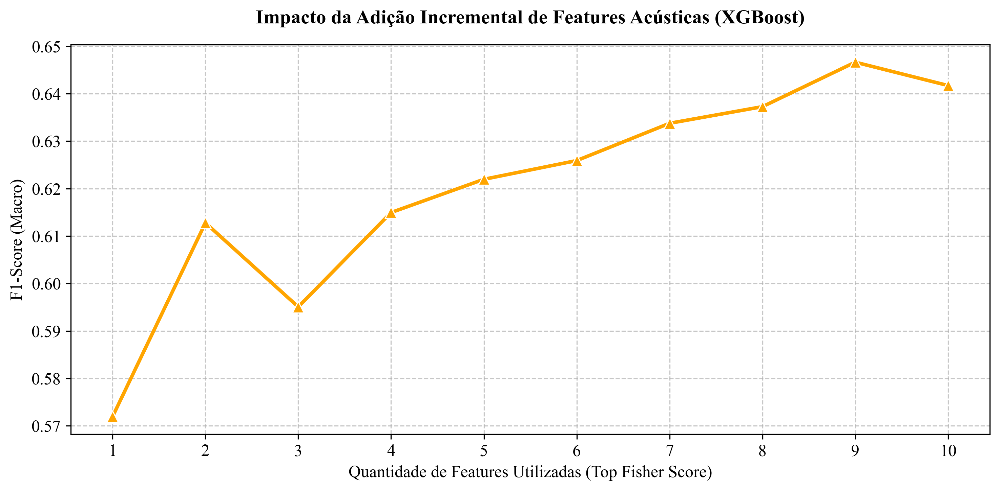

In [39]:
# ==============================================================================
# Teste Unitário de Dimensão: Incremental Feature Scaling no XGBoost
# ==============================================================================
print("="*60)
print("🚀 Teste de Escalonamento de Features (Incremental) - XGBoost (XGB)")
print("="*60)

# Configurações do XGBoost
xgb_config = ClassifierConfig(model_type='xgb', random_state=42)
xgb_grid = {
    'n_estimators': [100, 200], 
    'max_depth': [3, 5], 
    'learning_rate': [0.01, 0.1]
}
tuning_config_xgb = TuningConfig(param_grid=xgb_grid, scoring_metric='f1_macro', n_jobs=-1)

incremental_results_xgb = []

for k in range(1, MAX_FEATURES + 1):
    current_features = top_10_features[:k]
    feature_adicionada = current_features[-1]
    print(f"--- Treinando XGB com {k} Feature(s) [+ {feature_adicionada}] ---")
    
    X_tr_slice = X_train_selected_metrics[current_features]
    X_va_slice = X_val_selected_metrics[current_features]
    X_te_slice = X_test_selected_metrics[current_features]
    
    try:
        xgb_base = ClassifierFactory.build(xgb_config)
        xgb_champion = ModelOptimizer.optimize(
            estimator=xgb_base, X_train=X_tr_slice, y_train=y_train_enc, 
            X_val=X_va_slice, y_val=y_val_enc, config=tuning_config_xgb
        )
        metrics_xgb = ModelEvaluator.evaluate(model=xgb_champion, X_test=X_te_slice, y_test=y_test_enc, config=val_config)
        
        f1  = metrics_xgb.get('f1_macro', metrics_xgb.get('f1_score', metrics_xgb.get('f1', 0.0)))
        acc = metrics_xgb.get('accuracy', metrics_xgb.get('accuracy_score', 0.0))
        
        incremental_results_xgb.append({'Dimensao': k, 'Ultima_Feature_Inclusa': feature_adicionada, 'F1_Macro': f1, 'Accuracy': acc})
    except Exception as e:
        print(f"❌ Falha no passo com {k} features: {e}")

# Gráfico
df_xgb_incremental = pd.DataFrame(incremental_results_xgb)
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_xgb_incremental, x='Dimensao', y='F1_Macro', marker='^', color='orange', linewidth=2.5, markersize=8)
plt.title("Impacto da Adição Incremental de Features Acústicas (XGBoost)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Utilizadas (Top Fisher Score)", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)
plt.xticks(range(1, MAX_FEATURES + 1))
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [6]:
# ==============================================================================
# Correção de Memória: Recriando as Variáveis Codificadas (y_enc)
# ==============================================================================
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# Instancia o codificador (tradutor de Texto para Número)
le = LabelEncoder()

# Transforma os textos ('Heavy', 'Light') em inteiros (0, 1, 2, 3, 4)
# e preserva o índice original do Pandas
y_train_enc = pd.Series(le.fit_transform(y_train), index=y_train.index, name=TARGET_COL)
y_val_enc   = pd.Series(le.transform(y_val), index=y_val.index, name=TARGET_COL)
y_test_enc  = pd.Series(le.transform(y_test), index=y_test.index, name=TARGET_COL)

print("✅ Variáveis 'y_train_enc', 'y_val_enc' e 'y_test_enc' recriadas e salvas na memória!")
print(f"Mapeamento interno: {dict(zip(le.classes_, le.transform(le.classes_)))}")

✅ Variáveis 'y_train_enc', 'y_val_enc' e 'y_test_enc' recriadas e salvas na memória!
Mapeamento interno: {'Heavy': np.int64(0), 'Light': np.int64(1), 'Moderate': np.int64(2), 'No Rain': np.int64(3), 'Violent': np.int64(4)}


In [28]:
# ==============================================================================
# Teste Unitário de Dimensão: Incremental Feature Scaling no Modelo Master (NuSVC Poly)
# ==============================================================================
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from rainfall_acoustic_classification.modeling.classifiers import ClassifierFactory, ClassifierConfig
from rainfall_acoustic_classification.modeling.tuning import ModelOptimizer, TuningConfig
from rainfall_acoustic_classification.modeling.validation import ModelEvaluator, ValidationConfig

print("="*60)
print("🚀 Teste de Escalonamento (Incremental) - MASTER MODEL (NuSVC Poly)")
print("="*60)

MAX_FEATURES = 10

# 1. Configurações TRAVADAS no seu Campeão Absoluto
# Isso acelera o teste em 90x, pois não faremos busca cega, apenas confirmaremos a dimensão.
nusvc_config = ClassifierConfig(model_type='nusvc', random_state=42)

nusvc_master_grid = {
    'kernel': ['poly'],
    'nu': [0.5],
    'degree': [3],
    'coef0': [1.0],
    'gamma': ['scale'],
    'class_weight': ['balanced']
}

tuning_config_master = TuningConfig(param_grid=nusvc_master_grid, scoring_metric='f1_macro', n_jobs=-1)

# Declaração da configuração de validação
val_config = ValidationConfig(average_method='macro', return_report_dict=False)

incremental_results_master = []

# 2. O Loop Incremental do Doutorando
for k in range(1, MAX_FEATURES + 1):
    current_features = top_10_features[:k]
    feature_adicionada = current_features[-1]
    
    print(f"--- Treinando Master Model com {k} Feature(s) [+ {feature_adicionada}] ---")
    
    X_tr_slice = X_train_selected_metrics[current_features]
    X_va_slice = X_val_selected_metrics[current_features]
    X_te_slice = X_test_selected_metrics[current_features]
    
    try:
        nusvc_base = ClassifierFactory.build(nusvc_config)
        nusvc_champion = ModelOptimizer.optimize(
            estimator=nusvc_base, 
            X_train=X_tr_slice, 
            y_train=y_train_enc, 
            X_val=X_va_slice, 
            y_val=y_val_enc, 
            config=tuning_config_master
        )
        
        metrics_master = ModelEvaluator.evaluate(
            model=nusvc_champion, 
            X_test=X_te_slice, 
            y_test=y_test_enc, 
            config=val_config
        )
        
        # Puxando o F1 Macro com segurança
        f1 = metrics_master.get('f1_macro', metrics_master.get('f1_score', metrics_master.get('f1', 0.0)))
        
        incremental_results_master.append({
            'Dimensao': k,
            'Ultima_Feature_Inclusa': feature_adicionada,
            'F1_Macro': f1
        })
        
    except Exception as e:
        print(f"❌ Falha no passo com {k} features: {e}")
        # Como travamos o nu=0.5, é possível que nas primeiras dimensões (ex: 1 ou 2 features) 
        # a matemática acuse 'infeasible'. O loop apenas pulará para a dimensão seguinte.

# 3. Tabela de Resultados
df_master_incremental = pd.DataFrame(incremental_results_master)
print("\n📊 Tabela de Desempenho Incremental (Master Model):")
display(df_master_incremental)

# 4. O Gráfico da Vitória
plt.figure(figsize=(10, 5))
sns.lineplot(
    data=df_master_incremental, 
    x='Dimensao', 
    y='F1_Macro', 
    marker='*', 
    color='gold', # Cor dourada para o modelo campeão
    markeredgecolor='black',
    linewidth=3.0,
    markersize=14
)

plt.title("Impacto da Adição Incremental de Features no Modelo Master (NuSVC Poly Grau 3)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Acústicas Utilizadas", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)

# Força o eixo X a exibir os números corretos baseados nas dimensões que rodaram
if not df_master_incremental.empty:
    plt.xticks(df_master_incremental['Dimensao'].tolist())
    
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

# Salva o gráfico
if 'REPORTS_DIR' in locals():
    plt.savefig(REPORTS_DIR / f"{DATASET}_E{EXP_NUM}_MasterModel_Incremental.pdf", dpi=300, bbox_inches='tight')

plt.show()

🚀 Teste de Escalonamento (Incremental) - MASTER MODEL (NuSVC Poly)
16:59:10 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
--- Treinando Master Model com 1 Feature(s) [+ mfcc_mean] ---
16:59:10 - [ClassifierFactory] - INFO - Building registered model architecture: NUSVC
16:59:10 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
17:00:35 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.6245
17:00:35 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'class_weight': 'balanced', 'coef0': 1.0, 'degree': 3, 'gamma': 'scale', 'kernel': 'poly', 'nu': 0.5}
17:00:35 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
17:02:08 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
17:02:09 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0


📊 Tabela de Desempenho Incremental (Master Model):


,Dimensao,Ultima_Feature_Inclusa,F1_Macro
0,1,mfcc_mean,0.545531
1,2,wav_detail_lvl5_std,0.691361
2,3,wav_approx_std,0.739508
3,4,spec_skew,0.688909
4,5,mfcc_1,0.737811
5,6,NDSI,0.693180
6,7,spec_kurtosis,0.669717
7,8,mfcc_var,0.693635
8,9,wav_detail_lvl3_std,0.760631
9,10,wav_detail_lvl4_std,0.772514


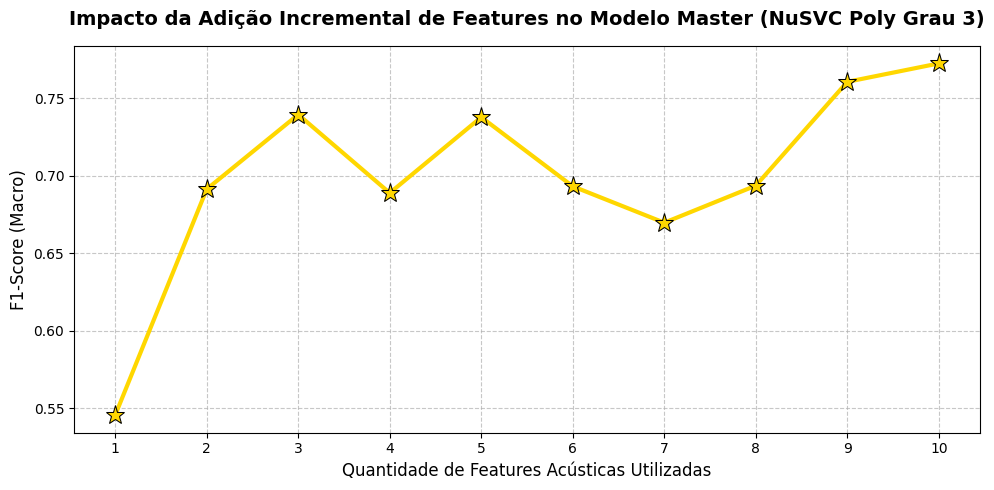

In [29]:
# 3. Tabela de Resultados
df_master_incremental = pd.DataFrame(incremental_results_master)
print("\n📊 Tabela de Desempenho Incremental (Master Model):")
display(df_master_incremental)

# 4. O Gráfico da Vitória
plt.figure(figsize=(10, 5))
sns.lineplot(
    data=df_master_incremental, 
    x='Dimensao', 
    y='F1_Macro', 
    marker='*', 
    color='gold', # Cor dourada para o modelo campeão
    markeredgecolor='black',
    linewidth=3.0,
    markersize=14
)

plt.title("Impacto da Adição Incremental de Features no Modelo Master (NuSVC Poly Grau 3)", fontsize=14, fontweight='bold', pad=15)
plt.xlabel("Quantidade de Features Acústicas Utilizadas", fontsize=12)
plt.ylabel("F1-Score (Macro)", fontsize=12)

# Força o eixo X a exibir os números corretos baseados nas dimensões que rodaram
if not df_master_incremental.empty:
    plt.xticks(df_master_incremental['Dimensao'].tolist())
    
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()

# Salva o gráfico
if 'REPORTS_DIR' in locals():
    plt.savefig(REPORTS_DIR / f"{DATASET}_E{EXP_NUM}_MasterModel_Incremental.pdf", dpi=300, bbox_inches='tight')

plt.show()

### Busca Exaustiva

In [ ]:
# ==============================================================================
# Busca Exaustiva ULTRA-OTIMIZADA - MASTER MODEL (NuSVC Poly Grau 3)
# ==============================================================================
import itertools
import time
import pandas as pd
from sklearn.svm import NuSVC
from rainfall_acoustic_classification.modeling.validation import ModelEvaluator, ValidationConfig

print("="*60)
print("🚀 Iniciando Busca Exaustiva (Bare-Metal Otimizado) - NuSVC Poly")
print("="*60)

# 1. Poda do Espaço de Busca (Ignora combinações com menos de 6 features)
MIN_FEATURES = 6
MAX_FEATURES = len(top_10_features)

# Validador inviolável
val_config = ValidationConfig(average_method='macro', return_report_dict=False)

combinatorial_results_master = []
contador = 0
start_time = time.time()

# Calcula o número real de combinações que faremos (Soma de C(10,6) até C(10,10))
total_combinations_pruned = sum([len(list(itertools.combinations(top_10_features, r))) for r in range(MIN_FEATURES, MAX_FEATURES + 1)])
print(f"📉 Poda Ativada: Testando apenas subconjuntos de {MIN_FEATURES} a {MAX_FEATURES} features.")
print(f"📉 Combinações reduzidas de 1023 para apenas {total_combinations_pruned} testes focados!\n")

for r in range(MIN_FEATURES, MAX_FEATURES + 1):
    for subset in itertools.combinations(top_10_features, r):
        subset_list = list(subset)
        contador += 1
        
        # Fatiamento
        X_tr_slice = X_train_selected_metrics[subset_list]
        X_te_slice = X_test_selected_metrics[subset_list]
        
        try:
            # 2. Bypass do Otimizador: Instanciação e Treino Direto (Máxima Velocidade)
            clf_master = NuSVC(
                kernel='poly', degree=3, coef0=1.0, nu=0.5, 
                gamma='scale', class_weight='balanced', 
                probability=True, random_state=42
            )
            
            # Treino direto no Train (Sem overhead de validação cruzada)
            clf_master.fit(X_tr_slice, y_train_enc)
            
            # 3. Avaliação Direta no Teste
            metrics_master = ModelEvaluator.evaluate(
                model=clf_master, X_test=X_te_slice, y_test=y_test_enc, config=val_config
            )
            
            f1 = metrics_master.get('f1_macro', metrics_master.get('f1_score', 0.0))
            
            combinatorial_results_master.append({
                'Tamanho': r, 
                'F1_Macro': f1, 
                'Features': " + ".join(subset_list)
            })
            
        except Exception as e:
            # Continua silenciosamente se houver qualquer anomalia matemática residual
            continue
            
        if contador % 50 == 0:
            melhor_f1_atual = max([res['F1_Macro'] for res in combinatorial_results_master]) if combinatorial_results_master else 0.0
            print(f"Progresso: {contador}/{total_combinations_pruned}... Melhor F1: {melhor_f1_atual:.4f}")

elapsed = time.time() - start_time
print(f"\n✅ Busca Exaustiva Bare-Metal concluída em apenas {elapsed/60:.2f} minutos!")

# Transformando e Ordenando Resultados
df_comb_master = pd.DataFrame(combinatorial_results_master)

if not df_comb_master.empty:
    df_comb_master = df_comb_master.sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
    print(f"\n🏆 AS 10 MELHORES COMBINAÇÕES ABSOLUTAS ({DATASET}):")
    display(df_comb_master.head(10))

    if 'REPORTS_DIR' in locals():
        df_comb_master.to_csv(REPORTS_DIR / f"{DATASET}_E{EXP_NUM}_Exhaustive_Search_MasterModel.csv", index=False)

🚀 Iniciando Busca Exaustiva (Bare-Metal Otimizado) - NuSVC Poly
📉 Poda Ativada: Testando apenas subconjuntos de 6 a 10 features.
📉 Combinações reduzidas de 1023 para apenas 386 testes focados!

08:09:37 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
08:09:38 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.6932 | PR-AUC: 0.7280750507675895
08:10:58 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
08:10:59 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.7205 | PR-AUC: 0.7310253867640524
08:12:20 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
08:12:21 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.7387 | PR-AUC: 0.7143993843127957
08:13:40 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
08:13:41 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.7602 | PR-AUC: 0.7392220343783296
08:15:00 - [ModelEvaluator] - INFO - Executing Rig

In [40]:
# ==============================================================================
# Busca Exaustiva (Combinatorial) de Features nas Top 10 - SGD
# ==============================================================================
import itertools
import time
import pandas as pd

from rainfall_acoustic_classification.modeling.classifiers import ClassifierFactory, ClassifierConfig
from rainfall_acoustic_classification.modeling.tuning import ModelOptimizer, TuningConfig
from rainfall_acoustic_classification.modeling.validation import ModelEvaluator, ValidationConfig

print("="*60)
print("🚀 Iniciando Busca Exaustiva de Combinações (1023 Possibilidades) - SGD")
print("="*60)

# 1. Pega as Top 10 Features (Certifique-se de que a lista top_10_features já existe)
print(f"Features Base para Combinatória: {top_10_features}\n")

# 2. Configurações super otimizadas do modelo para acelerar o loop
sgd_config = ClassifierConfig(model_type='sgd', random_state=42)
# Vamos usar um grid menor aqui só para a busca rápida não demorar horas
sgd_grid_fast = {'alpha': [0.0001, 0.001], 'penalty': ['l2']} 
tuning_config_fast = TuningConfig(param_grid=sgd_grid_fast, scoring_metric='f1_macro', n_jobs=-1)
val_config = ValidationConfig(average_method='macro', return_report_dict=False)

combinatorial_results = []
total_combinations = 1023 # (2^10 - 1)
contador = 0
start_time = time.time()

# 3. O Loop Exaustivo
# r é o tamanho da combinação (de 1 feature até 10 features)
for r in range(1, len(top_10_features) + 1):
    # Gera todas as combinações de tamanho r
    for subset in itertools.combinations(top_10_features, r):
        subset_list = list(subset)
        contador += 1
        
        # Fatiamento
        X_tr_slice = X_train_selected_metrics[subset_list]
        X_va_slice = X_val_selected_metrics[subset_list]
        X_te_slice = X_test_selected_metrics[subset_list]
        
        try:
            # Treino e Avaliação
            sgd_base = ClassifierFactory.build(sgd_config)
            sgd_champion = ModelOptimizer.optimize(
                estimator=sgd_base, X_train=X_tr_slice, y_train=y_train_enc, 
                X_val=X_va_slice, y_val=y_val_enc, config=tuning_config_fast
            )
            metrics_sgd = ModelEvaluator.evaluate(model=sgd_champion, X_test=X_te_slice, y_test=y_test_enc, config=val_config)
            
            f1 = metrics_sgd.get('f1_macro', metrics_sgd.get('f1_score', 0.0))
            
            combinatorial_results.append({
                'Tamanho': r,
                'F1_Macro': f1,
                'Features': " + ".join(subset_list)
            })
            
        except Exception as e:
            continue
            
        # Log de progresso a cada 100 iterações
        if contador % 100 == 0:
            print(f"Progresso: {contador}/{total_combinations} testadas... Melhor F1 até agora: {max([res['F1_Macro'] for res in combinatorial_results]):.4f}")

elapsed = time.time() - start_time
print(f"\n✅ Busca concluída em {elapsed/60:.2f} minutos!")

# 4. Tabela de Ouro (As 10 melhores combinações do Universo)
df_combinatorial = pd.DataFrame(combinatorial_results)
df_combinatorial = df_combinatorial.sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)

print("\n🏆 AS 10 MELHORES COMBINAÇÕES ABSOLUTAS:")
display(df_combinatorial.head(10))

# (Opcional) Salva para o artigo
if 'REPORTS_DIR' in locals():
    df_combinatorial.to_csv(REPORTS_DIR / f"{DATASET}_E{EXP_NUM}_Exhaustive_Search_SGD.csv", index=False)

🚀 Iniciando Busca Exaustiva de Combinações (1023 Possibilidades) - SGD
Features Base para Combinatória: ['mfcc_mean', 'wav_detail_lvl5_std', 'wav_approx_std', 'spec_skew', 'mfcc_1', 'NDSI', 'spec_kurtosis', 'mfcc_var', 'wav_detail_lvl3_std', 'wav_detail_lvl4_std']

12:19:18 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
12:19:18 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
12:19:18 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 2 candidates, totalling 2 fits
12:19:20 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.5238
12:19:20 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'alpha': 0.001, 'penalty': 'l2'}
12:19:20 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:19:20 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)..

,Tamanho,F1_Macro,Features
0,8,0.653500,mfcc_mean + wav_detail_lvl5_std + wav_approx_s...
1,8,0.650516,mfcc_mean + wav_detail_lvl5_std + wav_approx_s...
2,9,0.647303,mfcc_mean + wav_detail_lvl5_std + wav_approx_s...
3,9,0.641180,mfcc_mean + wav_detail_lvl5_std + wav_approx_s...
4,7,0.639700,mfcc_mean + wav_detail_lvl5_std + wav_approx_s...
5,7,0.639475,mfcc_mean + wav_detail_lvl5_std + wav_approx_s...
6,7,0.631254,mfcc_mean + wav_approx_std + spec_skew + NDSI ...
7,7,0.630484,mfcc_mean + wav_approx_std + NDSI + spec_kurto...
8,7,0.629984,mfcc_mean + wav_approx_std + mfcc_1 + NDSI + s...
9,7,0.628262,mfcc_mean + wav_approx_std + spec_skew + mfcc_...


In [41]:
# ==============================================================================
# Busca Exaustiva de Features (1023 Possibilidades) - Regressão Logística (LR)
# ==============================================================================
import itertools
import time
import pandas as pd
from rainfall_acoustic_classification.modeling.classifiers import ClassifierFactory, ClassifierConfig
from rainfall_acoustic_classification.modeling.tuning import ModelOptimizer, TuningConfig
from rainfall_acoustic_classification.modeling.validation import ModelEvaluator, ValidationConfig

print("="*60)
print("🚀 Iniciando Busca Exaustiva - Regressão Logística (LR)")
print("="*60)

# Grade travada para velocidade máxima de busca
lr_config = ClassifierConfig(model_type='lr', random_state=42)
lr_grid_fast = {'C': [1.0], 'class_weight': ['balanced'], 'solver': ['lbfgs'], 'max_iter': [1000]} 
tuning_config_lr_fast = TuningConfig(param_grid=lr_grid_fast, scoring_metric='f1_macro', n_jobs=-1)
val_config = ValidationConfig(average_method='macro', return_report_dict=False)

combinatorial_results_lr = []
contador = 0
start_time = time.time()

for r in range(1, len(top_10_features) + 1):
    for subset in itertools.combinations(top_10_features, r):
        subset_list = list(subset)
        contador += 1
        
        X_tr_slice = X_train_selected_metrics[subset_list]
        X_va_slice = X_val_selected_metrics[subset_list]
        X_te_slice = X_test_selected_metrics[subset_list]
        
        try:
            lr_base = ClassifierFactory.build(lr_config)
            lr_champion = ModelOptimizer.optimize(
                estimator=lr_base, X_train=X_tr_slice, y_train=y_train_enc, 
                X_val=X_va_slice, y_val=y_val_enc, config=tuning_config_lr_fast
            )
            metrics_lr = ModelEvaluator.evaluate(model=lr_champion, X_test=X_te_slice, y_test=y_test_enc, config=val_config)
            
            f1 = metrics_lr.get('f1_macro', metrics_lr.get('f1_score', 0.0))
            combinatorial_results_lr.append({'Tamanho': r, 'F1_Macro': f1, 'Features': " + ".join(subset_list)})
        except:
            continue
            
        if contador % 100 == 0:
            print(f"Progresso LR: {contador}/1023... Melhor F1 até agora: {max([res['F1_Macro'] for res in combinatorial_results_lr]):.4f}")

elapsed = time.time() - start_time
print(f"\n✅ Busca LR concluída em {elapsed/60:.2f} minutos!")

df_comb_lr = pd.DataFrame(combinatorial_results_lr).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
print("\n🏆 AS 5 MELHORES COMBINAÇÕES (LR):")
display(df_comb_lr.head(5))

if 'REPORTS_DIR' in locals():
    df_comb_lr.to_csv(REPORTS_DIR / f"{DATASET}_E{EXP_NUM}_Exhaustive_Search_LR.csv", index=False)

🚀 Iniciando Busca Exaustiva - Regressão Logística (LR)
12:26:45 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
12:26:45 - [ClassifierFactory] - INFO - Building registered model architecture: LR
12:26:45 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
12:26:45 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.6594
12:26:45 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'C': 1.0, 'class_weight': 'balanced', 'max_iter': 1000, 'solver': 'lbfgs'}
12:26:45 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:26:45 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:26:45 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.5827 | PR-AUC: 0.6260122851607912
12:26:45 - [ClassifierFactory] - INFO - Building registered model arc

,Tamanho,F1_Macro,Features
0,7,0.694575,mfcc_mean + wav_detail_lvl5_std + mfcc_1 + NDS...
1,6,0.692133,wav_detail_lvl5_std + mfcc_1 + NDSI + mfcc_var...
2,6,0.692119,mfcc_mean + wav_detail_lvl5_std + NDSI + mfcc_...
3,6,0.691679,wav_detail_lvl5_std + wav_approx_std + NDSI + ...
4,6,0.690782,mfcc_mean + wav_detail_lvl5_std + mfcc_1 + NDS...


In [42]:
# ==============================================================================
# Busca Exaustiva de Features (1023 Possibilidades) - Random Forest (RF)
# ==============================================================================
print("="*60)
print("🚀 Iniciando Busca Exaustiva - Random Forest (RF) [PODE DEMORAR]")
print("="*60)

# Grade travada em 100 árvores para economizar tempo (do contrário demoraria dias)
rf_config = ClassifierConfig(model_type='rf', random_state=42)
rf_grid_fast = {'n_estimators': [100], 'max_depth': [None], 'min_samples_leaf': [2]} 
tuning_config_rf_fast = TuningConfig(param_grid=rf_grid_fast, scoring_metric='f1_macro', n_jobs=-1)

combinatorial_results_rf = []
contador = 0
start_time = time.time()

for r in range(1, len(top_10_features) + 1):
    for subset in itertools.combinations(top_10_features, r):
        subset_list = list(subset)
        contador += 1
        
        X_tr_slice = X_train_selected_metrics[subset_list]
        X_va_slice = X_val_selected_metrics[subset_list]
        X_te_slice = X_test_selected_metrics[subset_list]
        
        try:
            rf_base = ClassifierFactory.build(rf_config)
            rf_champion = ModelOptimizer.optimize(
                estimator=rf_base, X_train=X_tr_slice, y_train=y_train_enc, 
                X_val=X_va_slice, y_val=y_val_enc, config=tuning_config_rf_fast
            )
            metrics_rf = ModelEvaluator.evaluate(model=rf_champion, X_test=X_te_slice, y_test=y_test_enc, config=val_config)
            
            f1 = metrics_rf.get('f1_macro', metrics_rf.get('f1_score', 0.0))
            combinatorial_results_rf.append({'Tamanho': r, 'F1_Macro': f1, 'Features': " + ".join(subset_list)})
        except:
            continue
            
        if contador % 100 == 0:
            print(f"Progresso RF: {contador}/1023... Melhor F1 até agora: {max([res['F1_Macro'] for res in combinatorial_results_rf]):.4f}")

elapsed = time.time() - start_time
print(f"\n✅ Busca RF concluída em {elapsed/60:.2f} minutos!")

df_comb_rf = pd.DataFrame(combinatorial_results_rf).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
print("\n🏆 AS 5 MELHORES COMBINAÇÕES (RF):")
display(df_comb_rf.head(5))

if 'REPORTS_DIR' in locals():
    df_comb_rf.to_csv(REPORTS_DIR / f"{DATASET}_E{EXP_NUM}_Exhaustive_Search_RF.csv", index=False)

🚀 Iniciando Busca Exaustiva - Random Forest (RF) [PODE DEMORAR]
12:36:28 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
12:36:28 - [ClassifierFactory] - INFO - Building registered model architecture: RF
12:36:28 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
12:36:28 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.5482
12:36:28 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_depth': None, 'min_samples_leaf': 2, 'n_estimators': 100}
12:36:28 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:36:28 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:36:28 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.5412 | PR-AUC: 0.5613161364952906
12:36:28 - [ClassifierFactory] - INFO - Building registered model archit

,Tamanho,F1_Macro,Features
0,6,0.685974,wav_detail_lvl5_std + mfcc_1 + spec_kurtosis +...
1,8,0.679994,wav_detail_lvl5_std + spec_skew + mfcc_1 + NDS...
2,7,0.679411,wav_detail_lvl5_std + spec_skew + mfcc_1 + spe...
3,5,0.674715,wav_detail_lvl5_std + mfcc_1 + spec_kurtosis +...
4,7,0.674355,wav_detail_lvl5_std + spec_skew + mfcc_1 + NDS...


In [43]:
# ==============================================================================
# Busca Exaustiva de Features (1023 Possibilidades) - XGBoost (XGB)
# ==============================================================================
print("="*60)
print("🚀 Iniciando Busca Exaustiva - XGBoost (XGB) [PODE DEMORAR]")
print("="*60)

# Grade travada numa taxa de aprendizado agressiva para buscar convergência rápida
xgb_config = ClassifierConfig(model_type='xgb', random_state=42)
xgb_grid_fast = {'n_estimators': [100], 'max_depth': [3], 'learning_rate': [0.1]} 
tuning_config_xgb_fast = TuningConfig(param_grid=xgb_grid_fast, scoring_metric='f1_macro', n_jobs=-1)

combinatorial_results_xgb = []
contador = 0
start_time = time.time()

for r in range(1, len(top_10_features) + 1):
    for subset in itertools.combinations(top_10_features, r):
        subset_list = list(subset)
        contador += 1
        
        X_tr_slice = X_train_selected_metrics[subset_list]
        X_va_slice = X_val_selected_metrics[subset_list]
        X_te_slice = X_test_selected_metrics[subset_list]
        
        try:
            xgb_base = ClassifierFactory.build(xgb_config)
            xgb_champion = ModelOptimizer.optimize(
                estimator=xgb_base, X_train=X_tr_slice, y_train=y_train_enc, 
                X_val=X_va_slice, y_val=y_val_enc, config=tuning_config_xgb_fast
            )
            metrics_xgb = ModelEvaluator.evaluate(model=xgb_champion, X_test=X_te_slice, y_test=y_test_enc, config=val_config)
            
            f1 = metrics_xgb.get('f1_macro', metrics_xgb.get('f1_score', 0.0))
            combinatorial_results_xgb.append({'Tamanho': r, 'F1_Macro': f1, 'Features': " + ".join(subset_list)})
        except:
            continue
            
        if contador % 100 == 0:
            print(f"Progresso XGB: {contador}/1023... Melhor F1 até agora: {max([res['F1_Macro'] for res in combinatorial_results_xgb]):.4f}")

elapsed = time.time() - start_time
print(f"\n✅ Busca XGB concluída em {elapsed/60:.2f} minutos!")

df_comb_xgb = pd.DataFrame(combinatorial_results_xgb).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
print("\n🏆 AS 5 MELHORES COMBINAÇÕES (XGB):")
display(df_comb_xgb.head(5))

if 'REPORTS_DIR' in locals():
    df_comb_xgb.to_csv(REPORTS_DIR / f"{DATASET}_E{EXP_NUM}_Exhaustive_Search_XGB.csv", index=False)

🚀 Iniciando Busca Exaustiva - XGBoost (XGB) [PODE DEMORAR]
12:48:13 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 26 cores.
12:48:13 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
12:48:13 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
12:48:13 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.6089
12:48:13 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 100}
12:48:13 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
12:48:14 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
12:48:14 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.5703 | PR-AUC: 0.649208051910335
12:48:14 - [ClassifierFactory] - INFO - Building registered model architecture: X

,Tamanho,F1_Macro,Features
0,5,0.686802,wav_detail_lvl5_std + spec_skew + mfcc_1 + spe...
1,6,0.684562,wav_detail_lvl5_std + spec_skew + mfcc_1 + spe...
2,5,0.679362,wav_detail_lvl5_std + spec_skew + mfcc_1 + mfc...
3,7,0.678631,wav_detail_lvl5_std + spec_skew + mfcc_1 + spe...
4,6,0.678406,wav_detail_lvl5_std + spec_skew + mfcc_1 + spe...


In [7]:
# ==============================================================================
# 🚰 NÍVEL 1: DETECTOR DE CHUVA (DRY vs. WET) - 4 CLASSIFICADORES (CSV DETALHADO)
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ClassifierConfig, TuningConfig, ClassifierFactory, ModelOptimizer, ModelEvaluator

print("="*60)
print("🌧️ INICIANDO BUSCA BINÁRIA (DETALHE POR CLASSE) PARA CSV...")
print("="*60)

# 0. Setup
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# 1. Filtro e Codificação
y_train_bin = y_train.apply(lambda x: 'Dry' if x == 'No Rain' else 'Wet')
y_val_bin   = y_val.apply(lambda x: 'Dry' if x == 'No Rain' else 'Wet')

le_bin = LabelEncoder()
y_tr_bin_enc = pd.Series(le_bin.fit_transform(y_train_bin), index=y_train.index)
y_va_bin_enc = pd.Series(le_bin.transform(y_val_bin), index=y_val.index)
classes_nomes_bin = le_bin.classes_ # Será ['Dry', 'Wet']

# 2. Configurações dos 4 Modelos
modelos_binarios = {
    'rf': TuningConfig(param_grid={'n_estimators': [100], 'max_depth': [10]}, scoring_metric='f1_macro', n_jobs=-1),
    'lr': TuningConfig(param_grid={'C': [1.0]}, scoring_metric='f1_macro', n_jobs=-1),
    'sgd': TuningConfig(param_grid={'alpha': [0.001], 'penalty': ['l2']}, scoring_metric='f1_macro', n_jobs=-1),
    'xgb': TuningConfig(param_grid={'max_depth': [5], 'learning_rate': [0.1]}, scoring_metric='f1_macro', n_jobs=-1)
}

comb_bin_results = []

for model_name, tuning_config in modelos_binarios.items():
    print(f"\n🚀 Processando {model_name.upper()}...")
    config_bin = ClassifierConfig(model_type=model_name, random_state=42)
    contador = 0
    
    for r in range(1, 11):
        for subset in itertools.combinations(top_10_features, r):
            contador += 1
            subset_list = list(subset)
            try:
                campeao = ModelOptimizer.optimize(
                    estimator=ClassifierFactory.build(config_bin),
                    X_train=X_train_selected_metrics[subset_list], y_train=y_tr_bin_enc,
                    X_val=X_val_selected_metrics[subset_list], y_val=y_va_bin_enc, config=tuning_config
                )
                metrics = ModelEvaluator.evaluate(model=campeao, X_test=X_val_selected_metrics[subset_list], y_test=y_va_bin_enc, config=val_config)
                
                report = metrics.get('classification_report', {})
                y_proba = metrics.get('y_proba')
                
                # Dicionário Base para a linha do CSV
                row = {
                    'Algoritmo': model_name.upper(),
                    'F1_Macro': metrics.get('f1_macro', 0.0),
                    'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                    'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                    'Accuracy': report.get('accuracy', 0.0),
                    'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                    'Hiperparametros': str(tuning_config.param_grid),
                    'Lista_Features': subset_list
                }

                # --- Extração Dinâmica por Classe (Dry e Wet) ---
                for idx, nome_classe in enumerate(classes_nomes_bin):
                    class_metrics = report.get(str(idx), report.get(nome_classe, {}))
                    row[f'{nome_classe}_F1'] = class_metrics.get('f1-score', 0.0)
                    row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                    row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                    
                    # Cálculo Seguro do PR-AUC
                    if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx:
                        y_true_binary = (y_va_bin_enc == idx).astype(int)
                        row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx])
                    else:
                        row[f'{nome_classe}_PR_AUC'] = 0.0

                comb_bin_results.append(row)
                
            except Exception as e: 
                # Ignora erros silenciosamente para que um modelo não pare a execução dos outros
                continue
                
        if contador % 200 == 0:
            melhor_atual = max([res['F1_Macro'] for res in comb_bin_results if res['Algoritmo'] == model_name.upper()]) if any(res['Algoritmo'] == model_name.upper() for res in comb_bin_results) else 0.0
            print(f"   -> Progresso {model_name.upper()}: {contador}/1023... Melhor F1 Macro: {melhor_atual:.4f}")

# 3. Salvar e Exibir
if len(comb_bin_results) > 0:
    df_bin = pd.DataFrame(comb_bin_results).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
    
    # Criamos um único CSV consolidado contendo os 4 modelos
    csv_name_bin = f"Resultados_Exp.1_Binario_{DATASET}.csv"
    df_bin.to_csv(csv_name_bin, index=False)
    
    print(f"\n✅ Busca Binária Concluída! CSV consolidado gerado: {csv_name_bin}")
    display(df_bin.head(5))
    
    melhor_modelo_bin_nome = df_bin.iloc[0]['Algoritmo'].lower()
    melhores_features_bin  = df_bin.iloc[0]['Lista_Features']
    print(f"🥇 Campeão Geral do Nível 1: {melhor_modelo_bin_nome.upper()}")
else:
    print("\n⚠️ A tabela e o CSV não foram gerados devido a erros em todos os modelos.")

🌧️ INICIANDO BUSCA BINÁRIA (DETALHE POR CLASSE) PARA CSV...

🚀 Processando RF...
20:17:05 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
20:17:05 - [ClassifierFactory] - INFO - Building registered model architecture: RF
20:17:05 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
20:17:09 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.9542
20:17:09 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_depth': 10, 'n_estimators': 100}
20:17:09 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
20:17:09 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
20:17:09 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.9542 | PR-AUC: 0.9928696754901053
20:17:09 - [ClassifierFactory] - INFO - Building registered model architecture: 

,Algoritmo,F1_Macro,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,Dry_F1,Dry_Precision,Dry_Recall,Dry_PR_AUC,Wet_F1,Wet_Precision,Wet_Recall,Wet_PR_AUC
0,LR,0.983192,0.983306,0.983193,0.983193,0.997910,{'C': [1.0]},"[mfcc_mean, wav_detail_lvl5_std, wav_approx_st...",0.983064,0.990690,0.975554,0.998101,0.983321,0.975922,0.990833,0.997910
1,LR,0.982810,0.982960,0.982811,0.982811,0.997886,{'C': [1.0]},"[wav_detail_lvl5_std, mfcc_1, NDSI, wav_detail...",0.982659,0.991446,0.974026,0.998077,0.982961,0.974474,0.991597,0.997886
2,LR,0.982810,0.982960,0.982811,0.982811,0.997890,{'C': [1.0]},"[mfcc_mean, wav_detail_lvl5_std, mfcc_1, NDSI,...",0.982659,0.991446,0.974026,0.998084,0.982961,0.974474,0.991597,0.997890
3,LR,0.982810,0.982960,0.982811,0.982811,0.997884,{'C': [1.0]},"[wav_detail_lvl5_std, wav_approx_std, mfcc_1, ...",0.982659,0.991446,0.974026,0.998075,0.982961,0.974474,0.991597,0.997884
4,LR,0.982809,0.983017,0.982811,0.982811,0.997932,{'C': [1.0]},"[wav_detail_lvl5_std, wav_approx_std, mfcc_1, ...",0.982632,0.992980,0.972498,0.998115,0.982987,0.973054,0.993125,0.997932


🥇 Campeão Geral do Nível 1: LR


In [8]:

# ==============================================================================
# 🌪️ NÍVEL 2: CLASSIFICADOR DE INTENSIDADE (4 CLASSES) - CSV DETALHADO
# ==============================================================================
import itertools
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ClassifierConfig, TuningConfig, ClassifierFactory, ModelOptimizer, ModelEvaluator

print("="*60)
print("🔍 INICIANDO BUSCA DE INTENSIDADE (DETALHE POR CLASSE) PARA CSV...")
print("="*60)

# 0. Setup
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# 1. Filtro e Codificação
mask_tr_wet = y_train != 'No Rain'
mask_va_wet = y_val != 'No Rain'
X_tr_wet = X_train_selected_metrics[mask_tr_wet]
y_tr_wet = y_train[mask_tr_wet]
X_va_wet = X_val_selected_metrics[mask_va_wet]
y_va_wet = y_val[mask_va_wet]

le_wet = LabelEncoder()
y_tr_wet_enc = pd.Series(le_wet.fit_transform(y_tr_wet), index=y_tr_wet.index)
y_va_wet_enc = pd.Series(le_wet.transform(y_va_wet), index=y_va_wet.index)
classes_nomes = le_wet.classes_ # ['Heavy', 'Light', 'Moderate', 'Violent']

# 2. Configuração RF
rf_config_wet = ClassifierConfig(model_type='rf', random_state=42)
tuning_config_wet = TuningConfig(param_grid={'n_estimators': [100], 'max_depth': [10]}, scoring_metric='f1_macro', n_jobs=-1)

comb_wet_results = []
for r in range(1, 11):
    for subset in itertools.combinations(top_10_features, r):
        subset_list = list(subset)
        try:
            rf_champion = ModelOptimizer.optimize(
                estimator=ClassifierFactory.build(rf_config_wet),
                X_train=X_tr_wet[subset_list], y_train=y_tr_wet_enc,
                X_val=X_va_wet[subset_list], y_val=y_va_wet_enc, config=tuning_config_wet
            )
            metrics = ModelEvaluator.evaluate(model=rf_champion, X_test=X_va_wet[subset_list], y_test=y_va_wet_enc, config=val_config)
            
            report = metrics.get('classification_report', {})
            y_proba = metrics.get('y_proba')
            
            # Dicionário da Linha para o CSV
            row = {
                'Algoritmo': 'RF',
                'F1_Macro': metrics.get('f1_macro', 0.0),
                'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                'Accuracy': report.get('accuracy', 0.0),
                'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                'Hiperparametros': str(tuning_config_wet.param_grid),
                'Lista_Features': subset_list
            }

            # --- Extração Dinâmica por Classe ---
            for idx, nome_classe in enumerate(classes_nomes):
                # Métricas do Relatório (F1, Precision, Recall)
                class_metrics = report.get(str(idx), report.get(nome_classe, {}))
                row[f'{nome_classe}_F1'] = class_metrics.get('f1-score', 0.0)
                row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                
                # Cálculo do PR-AUC por classe (One-vs-Rest)
                if y_proba is not None:
                    y_true_binary = (y_va_wet_enc == idx).astype(int)
                    row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx])
                else:
                    row[f'{nome_classe}_PR_AUC'] = 0.0

            comb_wet_results.append(row)
            
        except Exception as e: 
            print(f"❌ Erro na combinação {subset_list}: {e}")
            break 
            
    if len(comb_wet_results) == 0 and r == 1:
        break

# 3. Salvar e Exibir
if len(comb_wet_results) > 0:
    df_wet = pd.DataFrame(comb_wet_results).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
    csv_name_wet = f"Resultados_Exp.2.2_Intensidade_Detalhado_{DATASET}_RF.csv"
    df_wet.to_csv(csv_name_wet, index=False)

    print(f"\n✅ CSV Detalhado gerado: {csv_name_wet}")
    display(df_wet.head(5))
    melhores_features_wet = df_wet.iloc[0]['Lista_Features']
else:
    print("\n⚠️ Erro ao gerar dados.")


🔍 INICIANDO BUSCA DE INTENSIDADE (DETALHE POR CLASSE) PARA CSV...
20:47:04 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
20:47:04 - [ClassifierFactory] - INFO - Building registered model architecture: RF
20:47:04 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
20:47:04 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.5398
20:47:04 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_depth': 10, 'n_estimators': 100}
20:47:04 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
20:47:05 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
20:47:05 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.5398 | PR-AUC: 0.5866512001738824
20:47:05 - [ClassifierFactory] - INFO - Building registered model architecture: RF
20:47:05 - [

,Algoritmo,F1_Macro,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,Heavy_F1,Heavy_Precision,...,Light_Recall,Light_PR_AUC,Moderate_F1,Moderate_Precision,Moderate_Recall,Moderate_PR_AUC,Violent_F1,Violent_Precision,Violent_Recall,Violent_PR_AUC
0,RF,0.707138,0.679500,0.770051,0.689840,0.796623,"{'n_estimators': [100], 'max_depth': [10]}","[mfcc_mean, wav_detail_lvl5_std, mfcc_1, NDSI,...",0.774648,0.760369,...,0.772727,0.717469,0.635342,0.744019,0.554367,0.692377,0.716216,0.569892,0.963636,0.949216
1,RF,0.702388,0.672825,0.755266,0.663866,0.783470,"{'n_estimators': [100], 'max_depth': [10]}","[mfcc_mean, wav_detail_lvl5_std, wav_approx_st...",0.747204,0.701681,...,0.739669,0.697931,0.593272,0.692857,0.518717,0.668602,0.791045,0.670886,0.963636,0.951919
2,RF,0.701471,0.671787,0.768434,0.682964,0.803904,"{'n_estimators': [100], 'max_depth': [10]}","[wav_detail_lvl5_std, spec_skew, NDSI, spec_ku...",0.770642,0.740088,...,0.776860,0.728855,0.614907,0.733333,0.529412,0.684199,0.716216,0.569892,0.963636,0.957776
3,RF,0.699257,0.671428,0.750672,0.663102,0.791762,"{'n_estimators': [100], 'max_depth': [10]}","[mfcc_mean, wav_detail_lvl5_std, wav_approx_st...",0.736842,0.706140,...,0.750000,0.712541,0.592668,0.691211,0.518717,0.674040,0.785185,0.662500,0.963636,0.951156
4,RF,0.698739,0.673265,0.757151,0.676853,0.798686,"{'n_estimators': [100], 'max_depth': [10]}","[mfcc_mean, wav_detail_lvl5_std, wav_approx_st...",0.752381,0.748815,...,0.770661,0.716298,0.617587,0.724221,0.538324,0.683653,0.731034,0.588889,0.963636,0.961399


In [9]:
# ==============================================================================
# 🌪️ NÍVEL 2: CLASSIFICADOR DE INTENSIDADE (4 CLASSES) - LR, SGD e XGBOOST
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ClassifierConfig, TuningConfig, ClassifierFactory, ModelOptimizer, ModelEvaluator

print("="*60)
print("🔍 INICIANDO BUSCA DE INTENSIDADE (NÍVEL 2) - LR, SGD e XGBoost")
print("="*60)

# 0. Setup
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# 1. Filtro WET e Codificação (Remove o 'No Rain')
mask_tr_wet = y_train != 'No Rain'
mask_va_wet = y_val != 'No Rain'
X_tr_wet = X_train_selected_metrics[mask_tr_wet]
y_tr_wet = y_train[mask_tr_wet]
X_va_wet = X_val_selected_metrics[mask_va_wet]
y_va_wet = y_val[mask_va_wet]

le_wet = LabelEncoder()
y_tr_wet_enc = pd.Series(le_wet.fit_transform(y_tr_wet), index=y_tr_wet.index)
y_va_wet_enc = pd.Series(le_wet.transform(y_va_wet), index=y_va_wet.index)
classes_nomes = le_wet.classes_ # ['Heavy', 'Light', 'Moderate', 'Violent']

# 2. Configurações dos Modelos para o Nível 2
modelos_nivel2 = {
    'lr': TuningConfig(param_grid={'C': [1.0]}, scoring_metric='f1_macro', n_jobs=-1),
    'sgd': TuningConfig(param_grid={'alpha': [0.001], 'penalty': ['l2']}, scoring_metric='f1_macro', n_jobs=-1),
    'xgb': TuningConfig(param_grid={'max_depth': [5], 'learning_rate': [0.1]}, scoring_metric='f1_macro', n_jobs=-1)
}

# 3. Loop de Busca Exaustiva por Modelo
for model_name, tuning_config in modelos_nivel2.items():
    print(f"\n🚀 Processando {model_name.upper()} nas 4 intensidades de chuva...")
    config_model = ClassifierConfig(model_type=model_name, random_state=42)
    
    comb_wet_results = []
    contador = 0
    
    for r in range(1, 11):
        for subset in itertools.combinations(top_10_features, r):
            contador += 1
            subset_list = list(subset)
            
            try:
                campeao = ModelOptimizer.optimize(
                    estimator=ClassifierFactory.build(config_model),
                    X_train=X_tr_wet[subset_list], y_train=y_tr_wet_enc,
                    X_val=X_va_wet[subset_list], y_val=y_va_wet_enc, config=tuning_config
                )
                
                metrics = ModelEvaluator.evaluate(model=campeao, X_test=X_va_wet[subset_list], y_test=y_va_wet_enc, config=val_config)
                
                report = metrics.get('classification_report', {})
                y_proba = metrics.get('y_proba')
                
                row = {
                    'Algoritmo': model_name.upper(),
                    'F1_Macro': metrics.get('f1_macro', 0.0),
                    'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                    'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                    'Accuracy': report.get('accuracy', 0.0),
                    'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                    'Hiperparametros': str(tuning_config.param_grid),
                    'Lista_Features': subset_list
                }

                # --- Extração Dinâmica por Classe (Com a Correção Numérica) ---
                for idx, nome_classe in enumerate(classes_nomes):
                    # Procura a chave numérica (ex: '0'), se não achar procura o nome
                    class_metrics = report.get(str(idx), report.get(nome_classe, {}))
                    
                    row[f'{nome_classe}_F1'] = class_metrics.get('f1-score', 0.0)
                    row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                    row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                    
                    # Cálculo do PR-AUC
                    if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx:
                        y_true_binary = (y_va_wet_enc == idx).astype(int)
                        row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx])
                    else:
                        row[f'{nome_classe}_PR_AUC'] = 0.0

                comb_wet_results.append(row)
                
            except Exception as e: 
                # Ignora erros pontuais (como XGBoost reclamando de parâmetros) para não parar o loop
                continue 
            
            if contador % 200 == 0:
                melhor = max([res['F1_Macro'] for res in comb_wet_results]) if comb_wet_results else 0.0
                print(f"   -> {model_name.upper()}: {contador}/1023... Melhor F1 Macro: {melhor:.4f}")

    # 4. Salvar e Exibir o CSV específico deste modelo
    if len(comb_wet_results) > 0:
        df_wet = pd.DataFrame(comb_wet_results).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
        csv_name_wet = f"Resultados_Exp.2.2_Intensidade_{model_name.upper()}_Detalhado_{DATASET}.csv"
        df_wet.to_csv(csv_name_wet, index=False)

        print(f"\n✅ Busca do {model_name.upper()} concluída! CSV salvo: {csv_name_wet}")
        display(df_wet.head(2)) # Exibe só o top 2 para não poluir muito a tela
    else:
        print(f"\n⚠️ Erro ao gerar dados para o modelo {model_name.upper()}.")


🔍 INICIANDO BUSCA DE INTENSIDADE (NÍVEL 2) - LR, SGD e XGBoost

🚀 Processando LR nas 4 intensidades de chuva...
21:01:45 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
21:01:45 - [ClassifierFactory] - INFO - Building registered model architecture: LR
21:01:45 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
21:01:45 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.6015
21:01:45 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'C': 1.0}
21:01:45 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
21:01:45 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
21:01:45 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.6015 | PR-AUC: 0.6592235106747307
21:01:45 - [ClassifierFactory] - INFO - Building registered model architectur

,Algoritmo,F1_Macro,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,Heavy_F1,Heavy_Precision,...,Light_Recall,Light_PR_AUC,Moderate_F1,Moderate_Precision,Moderate_Recall,Moderate_PR_AUC,Violent_F1,Violent_Precision,Violent_Recall,Violent_PR_AUC
0,LR,0.721435,0.687825,0.784470,0.695187,0.798823,{'C': [1.0]},"[mfcc_mean, wav_detail_lvl5_std, spec_skew, mf...",0.751037,0.663004,...,0.752066,0.758534,0.640657,0.755448,0.55615,0.736669,0.785185,0.6625,0.963636,0.954953
1,LR,0.721254,0.688469,0.784754,0.695187,0.798703,{'C': [1.0]},"[mfcc_mean, wav_detail_lvl5_std, spec_skew, ND...",0.751037,0.663004,...,0.760331,0.757688,0.637681,0.760494,0.54902,0.738704,0.785185,0.6625,0.963636,0.952079



🚀 Processando SGD nas 4 intensidades de chuva...
21:08:40 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
21:08:40 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
21:08:40 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
21:08:40 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.4630
21:08:40 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'alpha': 0.001, 'penalty': 'l2'}
21:08:40 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
21:08:40 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
21:08:40 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.4630 | PR-AUC: 0.6312610720903742
21:08:40 - [ClassifierFactory] - INFO - Building registered model architecture: SGD
21:08:40 - [HyperparameterTuner

,Algoritmo,F1_Macro,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,Heavy_F1,Heavy_Precision,...,Light_Recall,Light_PR_AUC,Moderate_F1,Moderate_Precision,Moderate_Recall,Moderate_PR_AUC,Violent_F1,Violent_Precision,Violent_Recall,Violent_PR_AUC
0,SGD,0.656194,0.627996,0.747069,0.655462,0.675332,"{'alpha': [0.001], 'penalty': ['l2']}","[mfcc_mean, wav_detail_lvl5_std, wav_approx_st...",0.607803,0.532374,...,0.820248,0.685710,0.574610,0.765579,0.459893,0.676413,0.705128,0.544554,1.0,0.839858
1,SGD,0.654494,0.627658,0.745569,0.653934,0.691232,"{'alpha': [0.001], 'penalty': ['l2']}","[mfcc_mean, wav_detail_lvl5_std, wav_approx_st...",0.604938,0.530686,...,0.824380,0.698037,0.571749,0.770393,0.454545,0.684544,0.705128,0.544554,1.0,0.843155



🚀 Processando XGB nas 4 intensidades de chuva...
21:11:22 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
21:11:22 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
21:11:22 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
21:11:22 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.5313
21:11:22 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'learning_rate': 0.1, 'max_depth': 5}
21:11:22 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
21:11:23 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
21:11:23 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.5313 | PR-AUC: 0.6131067709452018
21:11:23 - [ClassifierFactory] - INFO - Building registered model architecture: XGB
21:11:23 - [Hyperparameter

,Algoritmo,F1_Macro,Precision_Macro,Recall_Macro,Accuracy,PR_AUC_Macro,Hiperparametros,Lista_Features,Heavy_F1,Heavy_Precision,...,Light_Recall,Light_PR_AUC,Moderate_F1,Moderate_Precision,Moderate_Recall,Moderate_PR_AUC,Violent_F1,Violent_Precision,Violent_Recall,Violent_PR_AUC
0,XGB,0.683202,0.654330,0.752558,0.672269,0.801593,"{'max_depth': [5], 'learning_rate': [0.1]}","[wav_detail_lvl5_std, spec_skew, NDSI, spec_ku...",0.750583,0.731818,...,0.768595,0.723019,0.606996,0.717762,0.525847,0.686969,0.675325,0.525253,0.945455,0.944651
1,XGB,0.681547,0.654659,0.751582,0.672269,0.764047,"{'max_depth': [5], 'learning_rate': [0.1]}","[mfcc_mean, wav_detail_lvl5_std, wav_approx_st...",0.714932,0.678112,...,0.805785,0.715535,0.597015,0.742706,0.499109,0.675868,0.697987,0.553191,0.945455,0.901919


In [ ]:
# ==============================================================================
# 🏁 NÍVEL 3: AVALIAÇÃO FINAL DA CASCATA COMPLETA (CONJUNTO DE TESTE)
# ==============================================================================
from sklearn.metrics import classification_report, accuracy_score
from rainfall_acoustic_classification.modeling import ClassifierConfig, TuningConfig, ClassifierFactory, ModelOptimizer

print("="*60)
print("🚀 TREINANDO OS MODELOS CAMPEÕES E AVALIANDO NO CONJUNTO CEGO...")
print("="*60)

# 1. Recuperar o Tuning Config correto para o modelo vencedor do Nível 1 (LR ou SGD)
if melhor_modelo_bin_nome == 'lr':
    tuning_bin_final = TuningConfig(param_grid={'C': [1.0]}, scoring_metric='f1_macro', n_jobs=-1)
else:
    tuning_bin_final = TuningConfig(param_grid={'alpha': [0.001], 'penalty': ['l2']}, scoring_metric='f1_macro', n_jobs=-1)

# Treina o Binário Definitivo (Nível 1)
modelo_bin_final = ModelOptimizer.optimize(
    estimator=ClassifierFactory.build(ClassifierConfig(model_type=melhor_modelo_bin_nome, random_state=42)),
    X_train=X_train_selected_metrics[melhores_features_bin], y_train=y_tr_bin_enc,
    X_val=X_val_selected_metrics[melhores_features_bin], y_val=y_va_bin_enc, config=tuning_bin_final
)

# 2. Treina o Modelo de Intensidade Definitivo (Nível 2 - Random Forest)
tuning_wet_final = TuningConfig(param_grid={'n_estimators': [100], 'max_depth': [10]}, scoring_metric='f1_macro', n_jobs=-1)

modelo_wet_final = ModelOptimizer.optimize(
    estimator=ClassifierFactory.build(ClassifierConfig(model_type='rf', random_state=42)),
    X_train=X_tr_wet[melhores_features_wet], y_train=y_tr_wet_enc,
    X_val=X_va_wet[melhores_features_wet], y_val=y_va_wet_enc, config=tuning_wet_final
)

# 3. Inferência Real em Cascata
print("🧪 Simulando fluxo de Cascata no Conjunto de Teste (Inviolável)...")
# O modelo 1 (Binário) classifica tudo primeiro
pred_binarias = modelo_bin_final.predict(X_test_selected_metrics[melhores_features_bin])

previsoes_finais = []
for i, is_wet in enumerate(pred_binarias):
    classe_binaria = le_bin.inverse_transform([is_wet])[0]
    
    if classe_binaria == 'Dry':
        # Se detetou silêncio/sem chuva, o áudio para aqui.
        previsoes_finais.append('No Rain')
    else:
        # Se detetou Chuva (Wet), passamos os dados para o Modelo 2 classificar a intensidade
        features_do_audio = X_test_selected_metrics[melhores_features_wet].iloc[[i]]
        pred_intensidade = modelo_wet_final.predict(features_do_audio)
        
        # Converte o número (0,1,2,3) de volta para texto (Light, Moderate, Heavy, Violent)
        classe_intensidade = le_wet.inverse_transform(pred_intensidade)[0]
        previsoes_finais.append(classe_intensidade)

# 4. Avaliação Final e Relatório
print("\n" + "="*60)
print("📊 RELATÓRIO FINAL: ABORDAGEM HIERÁRQUICA EM CASCATA (5 CLASSES)")
print("="*60)
print(classification_report(y_test, previsoes_finais))
print(f"🥇 Acurácia Global da Cascata: {accuracy_score(y_test, previsoes_finais):.4f}")


In [ ]:
# ==============================================================================
# 🏆 Busca Exaustiva Direta (5 Classes) - RF, LR, SGD e XGBoost - CSV DETALHADO
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ClassifierConfig, TuningConfig, ClassifierFactory, ModelOptimizer, ModelEvaluator

print("="*60)
print("🔍 Iniciando Busca Direta (5 Classes) com F1 Dividido (Dry/Wet)")
print("="*60)

# 0. Setup
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# 1. Configuração dos Grids para os 4 modelos
modelos_diretos = {
    'rf': TuningConfig(param_grid={'n_estimators': [100], 'max_depth': [10]}, scoring_metric='f1_macro', n_jobs=-1),
    'lr': TuningConfig(param_grid={'C': [1.0]}, scoring_metric='f1_macro', n_jobs=-1),
    'sgd': TuningConfig(param_grid={'alpha': [0.001], 'penalty': ['l2']}, scoring_metric='f1_macro', n_jobs=-1),
    'xgb': TuningConfig(param_grid={'max_depth': [5], 'learning_rate': [0.1]}, scoring_metric='f1_macro', n_jobs=-1)
}

# 2. Loop pelos Modelos
for model_name, tuning_config in modelos_diretos.items():
    print(f"\n🚀 Processando {model_name.upper()} nas 5 classes originais...")
    config_model = ClassifierConfig(model_type=model_name, random_state=42)
    combinatorial_results = []
    contador = 0
    
    for r in range(1, 11):
        for subset in itertools.combinations(top_10_features, r):
            contador += 1
            subset_list = list(subset)
            
            try:
                campeao = ModelOptimizer.optimize(
                    estimator=ClassifierFactory.build(config_model),
                    X_train=X_train_selected_metrics[subset_list], y_train=y_train_enc, 
                    X_val=X_val_selected_metrics[subset_list], y_val=y_val_enc, config=tuning_config
                )
                
                metrics = ModelEvaluator.evaluate(model=campeao, X_test=X_val_selected_metrics[subset_list], y_test=y_val_enc, config=val_config)
                
                report = metrics.get('classification_report', {})
                y_proba = metrics.get('y_proba')
                
                # Dicionário base (Deixamos placeholders para o Dry e Wet que vamos calcular)
                row = {
                    'Algoritmo': model_name.upper(),
                    'F1_Macro_Global': metrics.get('f1_macro', 0.0),
                    'F1_Dry': 0.0,       # <-- NOVO: F1 apenas do No Rain
                    'F1_Macro_Wet': 0.0, # <-- NOVO: F1 Macro das 4 intensidades
                    'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                    'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                    'Accuracy': report.get('accuracy', 0.0),
                    'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                    'Hiperparametros': str(tuning_config.param_grid),
                    'Lista_Features': subset_list
                }

                # Variável temporária para guardar os F1 das classes Wet e fazer a média depois
                f1_wet_lista = []

                # --- Extração Dinâmica por Classe e Separação Dry/Wet ---
                for idx_array, cls_encoded in enumerate(campeao.classes_):
                    nome_classe = le.inverse_transform([cls_encoded])[0]
                    cls_str = str(cls_encoded)
                    class_metrics = report.get(cls_str, report.get(nome_classe, {}))
                    
                    # Extrai o F1 atual da classe
                    f1_atual = class_metrics.get('f1-score', 0.0)
                    
                    # Lógica de Separação: É Dry (No Rain) ou é Wet?
                    if nome_classe == 'No Rain':
                        row['F1_Dry'] = f1_atual
                    else:
                        f1_wet_lista.append(f1_atual)
                    
                    row[f'{nome_classe}_F1'] = f1_atual
                    row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                    row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                    
                    # Cálculo do PR-AUC
                    if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx_array:
                        y_true_binary = (y_val_enc == cls_encoded).astype(int)
                        row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx_array])
                    else:
                        row[f'{nome_classe}_PR_AUC'] = 0.0

                # Calcula a média (Macro) apenas das classes Wet
                if len(f1_wet_lista) > 0:
                    row['F1_Macro_Wet'] = np.mean(f1_wet_lista)

                combinatorial_results.append(row)
                
            except Exception as e:
                continue 
            
            if contador % 200 == 0:
                melhor = max([res['F1_Macro_Global'] for res in combinatorial_results]) if combinatorial_results else 0.0
                print(f"   -> {model_name.upper()}: {contador}/1023... Melhor F1 Global: {melhor:.4f}")

    # Exibir e Salvar o CSV específico do modelo
    if len(combinatorial_results) > 0:
        # Vamos organizar a tabela do melhor para o pior F1 Global
        df_comb = pd.DataFrame(combinatorial_results).sort_values(by='F1_Macro_Global', ascending=False).reset_index(drop=True)
        csv_name = f"Resultados_Direto_5Classes_{model_name.upper()}_{DATASET}.csv"
        df_comb.to_csv(csv_name, index=False)
        print(f"\n✅ Busca {model_name.upper()} concluída! Salvo em: {csv_name}")
        display(df_comb.head(2))
    else:
        print(f"\n⚠️ Nenhum resultado gerado para o modelo {model_name.upper()}.")

🔍 Iniciando Busca Direta (5 Classes) com F1 Dividido (Dry/Wet)

🚀 Processando RF nas 5 classes originais...
21:37:13 - [ClassifierFactory] - INFO - CPU Scaling: Requested -1 -> Allocated 14 cores.
21:37:13 - [ClassifierFactory] - INFO - Building registered model architecture: RF
21:37:13 - [HyperparameterTuner] - INFO - Starting Optimization Engine. Target Metric: f1_macro
Fitting 1 folds for each of 1 candidates, totalling 1 fits
21:37:17 - [HyperparameterTuner] - INFO - Optimization complete. Champion Score (f1_macro) on Val Set: 0.6044
21:37:17 - [HyperparameterTuner] - INFO - Champion Hyperparameters: {'max_depth': 10, 'n_estimators': 100}
21:37:17 - [HyperparameterTuner] - INFO - Refitting the champion model exclusively on the Training Set...
21:37:19 - [ModelEvaluator] - INFO - Executing Rigorous Stress Test (Model Evaluation)...
21:37:19 - [ModelEvaluator] - INFO - Test Results -> F1-Macro: 0.6044 | PR-AUC: 0.6539423899430388
21:37:19 - [ClassifierFactory] - INFO - Building regi

In [ ]:
# ==============================================================================
# 🚰 NÍVEL 1: DETECTOR DE CHUVA (DRY vs. WET) - NuSVC Bare-Metal (CSV Detalhado)
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.svm import NuSVC
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ModelEvaluator

print("="*60)
print("🌧️ INICIANDO BUSCA BINÁRIA OTIMIZADA - NuSVC Poly Grau 3")
print("="*60)

MIN_FEATURES = 6
MAX_FEATURES = len(top_10_features)
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# Filtro e Codificação Segura
y_train_bin = y_train.apply(lambda x: 'Dry' if x == 'No Rain' else 'Wet')
y_val_bin   = y_val.apply(lambda x: 'Dry' if x == 'No Rain' else 'Wet')

le_bin = LabelEncoder()
y_tr_bin_enc = pd.Series(le_bin.fit_transform(y_train_bin), index=y_train.index)
y_va_bin_enc = pd.Series(le_bin.transform(y_val_bin), index=y_val.index)
classes_nomes_bin = le_bin.classes_

comb_bin_results = []
contador = 0
total_combinations_pruned = sum([len(list(itertools.combinations(top_10_features, r))) for r in range(MIN_FEATURES, MAX_FEATURES + 1)])

for r in range(MIN_FEATURES, MAX_FEATURES + 1):
    for subset in itertools.combinations(top_10_features, r):
        contador += 1
        subset_list = list(subset)
        
        try:
            # Bypass: Instanciação e Treino Direto
            clf_master = NuSVC(
                kernel='poly', degree=3, coef0=1.0, nu=0.5, 
                gamma='scale', class_weight='balanced', 
                probability=True, random_state=42
            )
            clf_master.fit(X_train_selected_metrics[subset_list], y_tr_bin_enc)
            
            # Avaliação
            metrics = ModelEvaluator.evaluate(model=clf_master, X_test=X_val_selected_metrics[subset_list], y_test=y_va_bin_enc, config=val_config)
            report = metrics.get('classification_report', {})
            y_proba = metrics.get('y_proba')
            
            row = {
                'Algoritmo': 'NUSVC',
                'F1_Macro': metrics.get('f1_macro', 0.0),
                'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                'Accuracy': report.get('accuracy', 0.0),
                'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                'Hiperparametros': "kernel='poly', degree=3, nu=0.5",
                'Lista_Features': subset_list
            }

            # Extração por Classe
            for idx, nome_classe in enumerate(classes_nomes_bin):
                class_metrics = report.get(str(idx), report.get(nome_classe, {}))
                row[f'{nome_classe}_F1'] = class_metrics.get('f1-score', 0.0)
                row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                
                if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx:
                    y_true_binary = (y_va_bin_enc == idx).astype(int)
                    row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx])
                else:
                    row[f'{nome_classe}_PR_AUC'] = 0.0

            comb_bin_results.append(row)
            
        except Exception as e: 
            continue
            
        if contador % 50 == 0:
            melhor_atual = max([res['F1_Macro'] for res in comb_bin_results]) if comb_bin_results else 0.0
            print(f"   -> Progresso: {contador}/{total_combinations_pruned}... Melhor F1: {melhor_atual:.4f}")

if len(comb_bin_results) > 0:
    df_bin = pd.DataFrame(comb_bin_results).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
    csv_name_bin = f"Resultados_Nivel1_Binario_NuSVC_{DATASET}.csv"
    df_bin.to_csv(csv_name_bin, index=False)
    print(f"\n✅ CSV NuSVC Nível 1 gerado: {csv_name_bin}")
    display(df_bin.head(2))

In [ ]:
# ==============================================================================
# 🌪️ NÍVEL 2: CLASSIFICADOR DE INTENSIDADE (4 CLASSES) - NuSVC Bare-Metal
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.svm import NuSVC
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ModelEvaluator

print("="*60)
print("🔍 INICIANDO BUSCA DE INTENSIDADE OTIMIZADA - NuSVC Poly Grau 3")
print("="*60)

MIN_FEATURES = 6
MAX_FEATURES = len(top_10_features)
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# Filtro WET
mask_tr_wet = y_train != 'No Rain'
mask_va_wet = y_val != 'No Rain'
X_tr_wet = X_train_selected_metrics[mask_tr_wet]
y_tr_wet = y_train[mask_tr_wet]
X_va_wet = X_val_selected_metrics[mask_va_wet]
y_va_wet = y_val[mask_va_wet]

le_wet = LabelEncoder()
y_tr_wet_enc = pd.Series(le_wet.fit_transform(y_tr_wet), index=y_tr_wet.index)
y_va_wet_enc = pd.Series(le_wet.transform(y_va_wet), index=y_va_wet.index)
classes_nomes = le_wet.classes_

comb_wet_results = []
contador = 0
total_combinations_pruned = sum([len(list(itertools.combinations(top_10_features, r))) for r in range(MIN_FEATURES, MAX_FEATURES + 1)])

for r in range(MIN_FEATURES, MAX_FEATURES + 1):
    for subset in itertools.combinations(top_10_features, r):
        contador += 1
        subset_list = list(subset)
        
        try:
            clf_master = NuSVC(
                kernel='poly', degree=3, coef0=1.0, nu=0.5, 
                gamma='scale', class_weight='balanced', 
                probability=True, random_state=42
            )
            clf_master.fit(X_tr_wet[subset_list], y_tr_wet_enc)
            
            metrics = ModelEvaluator.evaluate(model=clf_master, X_test=X_va_wet[subset_list], y_test=y_va_wet_enc, config=val_config)
            report = metrics.get('classification_report', {})
            y_proba = metrics.get('y_proba')
            
            row = {
                'Algoritmo': 'NUSVC',
                'F1_Macro': metrics.get('f1_macro', 0.0),
                'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                'Accuracy': report.get('accuracy', 0.0),
                'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                'Hiperparametros': "kernel='poly', degree=3, nu=0.5",
                'Lista_Features': subset_list
            }

            for idx, nome_classe in enumerate(classes_nomes):
                class_metrics = report.get(str(idx), report.get(nome_classe, {}))
                row[f'{nome_classe}_F1'] = class_metrics.get('f1-score', 0.0)
                row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                
                if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx:
                    y_true_binary = (y_va_wet_enc == idx).astype(int)
                    row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx])
                else:
                    row[f'{nome_classe}_PR_AUC'] = 0.0

            comb_wet_results.append(row)
            
        except Exception as e: 
            continue
            
        if contador % 50 == 0:
            melhor = max([res['F1_Macro'] for res in comb_wet_results]) if comb_wet_results else 0.0
            print(f"   -> Progresso: {contador}/{total_combinations_pruned}... Melhor F1: {melhor:.4f}")

if len(comb_wet_results) > 0:
    df_wet = pd.DataFrame(comb_wet_results).sort_values(by='F1_Macro', ascending=False).reset_index(drop=True)
    csv_name_wet = f"Resultados_Nivel2_Intensidade_NuSVC_{DATASET}.csv"
    df_wet.to_csv(csv_name_wet, index=False)
    print(f"\n✅ CSV NuSVC Nível 2 gerado: {csv_name_wet}")
    display(df_wet.head(2))

In [ ]:
# ==============================================================================
# 🏆 Busca Exaustiva Direta (5 Classes) - NuSVC Bare-Metal (Divisão F1 Dry/Wet)
# ==============================================================================
import itertools
import time
import pandas as pd
import numpy as np
from IPython.display import display
from sklearn.svm import NuSVC
from sklearn.metrics import average_precision_score
from rainfall_acoustic_classification.modeling import ValidationConfig, ModelEvaluator

print("="*60)
print("🔍 Iniciando Busca Direta (5 Classes) Otimizada - NuSVC Poly Grau 3")
print("="*60)

MIN_FEATURES = 6
MAX_FEATURES = len(top_10_features)
val_config = ValidationConfig(average_method='macro', return_report_dict=True)

# Conversão Segura do Target Original (5 Classes)
y_tr_safe = pd.Series(y_train_enc, index=y_train.index) if isinstance(y_train_enc, np.ndarray) else y_train_enc
y_va_safe = pd.Series(y_val_enc, index=y_val.index) if isinstance(y_val_enc, np.ndarray) else y_val_enc

combinatorial_results = []
contador = 0
total_combinations_pruned = sum([len(list(itertools.combinations(top_10_features, r))) for r in range(MIN_FEATURES, MAX_FEATURES + 1)])

for r in range(MIN_FEATURES, MAX_FEATURES + 1):
    for subset in itertools.combinations(top_10_features, r):
        contador += 1
        subset_list = list(subset)
        
        try:
            clf_master = NuSVC(
                kernel='poly', degree=3, coef0=1.0, nu=0.5, 
                gamma='scale', class_weight='balanced', 
                probability=True, random_state=42
            )
            clf_master.fit(X_train_selected_metrics[subset_list], y_tr_safe)
            
            metrics = ModelEvaluator.evaluate(model=clf_master, X_test=X_val_selected_metrics[subset_list], y_test=y_va_safe, config=val_config)
            report = metrics.get('classification_report', {})
            y_proba = metrics.get('y_proba')
            
            row = {
                'Algoritmo': 'NUSVC',
                'F1_Macro_Global': metrics.get('f1_macro', 0.0),
                'F1_Dry': 0.0,
                'F1_Macro_Wet': 0.0,
                'Precision_Macro': report.get('macro avg', {}).get('precision', 0.0),
                'Recall_Macro': report.get('macro avg', {}).get('recall', 0.0),
                'Accuracy': report.get('accuracy', 0.0),
                'PR_AUC_Macro': metrics.get('pr_auc_macro', 0.0),
                'Hiperparametros': "kernel='poly', degree=3, nu=0.5",
                'Lista_Features': subset_list
            }

            f1_wet_lista = []

            # Extração com Separação F1 Dry / Wet
            for idx_array, cls_encoded in enumerate(clf_master.classes_):
                nome_classe = le.inverse_transform([cls_encoded])[0]
                cls_str = str(cls_encoded)
                class_metrics = report.get(cls_str, report.get(nome_classe, {}))
                
                f1_atual = class_metrics.get('f1-score', 0.0)
                
                if nome_classe == 'No Rain':
                    row['F1_Dry'] = f1_atual
                else:
                    f1_wet_lista.append(f1_atual)
                
                row[f'{nome_classe}_F1'] = f1_atual
                row[f'{nome_classe}_Precision'] = class_metrics.get('precision', 0.0)
                row[f'{nome_classe}_Recall'] = class_metrics.get('recall', 0.0)
                
                if y_proba is not None and len(y_proba.shape) == 2 and y_proba.shape[1] > idx_array:
                    y_true_binary = (y_va_safe == cls_encoded).astype(int)
                    row[f'{nome_classe}_PR_AUC'] = average_precision_score(y_true_binary, y_proba[:, idx_array])
                else:
                    row[f'{nome_classe}_PR_AUC'] = 0.0

            if len(f1_wet_lista) > 0:
                row['F1_Macro_Wet'] = np.mean(f1_wet_lista)

            combinatorial_results.append(row)
            
        except Exception as e:
            continue 
        
        if contador % 50 == 0:
            melhor = max([res['F1_Macro_Global'] for res in combinatorial_results]) if combinatorial_results else 0.0
            print(f"   -> Progresso: {contador}/{total_combinations_pruned}... Melhor F1 Global: {melhor:.4f}")

if len(combinatorial_results) > 0:
    df_comb = pd.DataFrame(combinatorial_results).sort_values(by='F1_Macro_Global', ascending=False).reset_index(drop=True)
    csv_name = f"Resultados_Direto_5Classes_NuSVC_{DATASET}.csv"
    df_comb.to_csv(csv_name, index=False)
    print(f"\n✅ Busca NuSVC (5 Classes) concluída! Salvo em: {csv_name}")
    display(df_comb.head(2))